In [3]:
# Packages have to go in this order... I don't know why

import numpy as np
import pandas as pd
import xarray as xr
import eofs
from eofs.standard import Eof
import glob



# you need intake-esm V 2020.11.4 and intake V 0.6.0

# import tensorflow as tf

import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from shapely.geometry.polygon import LinearRing


import matplotlib as mpl
import matplotlib.pyplot as plt
from netCDF4 import Dataset
from matplotlib import cm

import copy
import fsspec
import pop_tools
import intake

from sklearn import linear_model

## Any useful Functions

In [4]:
def is_feb(month):
    return (month==2)

#use 
#monthly_data = ds.sel(time=is_feb(ds['time.month']))

def is_mar(month):
    return (month==3)

#use 
#monthly_data = ds.sel(time=is_mar(ds['time.month']))

def is_nov(month):
    return (month==10)

#use 
#monthly_data = ds.sel(time=is_nov(ds['time.month']))


def is_dec(month):
    return (month==12)

## Create and Connect to Dask

In [5]:
# from dask.distributed import Client

# # Create cluster
# from dask_gateway import Gateway

# gateway = Gateway()
# cluster = gateway.new_cluster()
# cluster.adapt(minimum=2, maximum=100)
# # Connect to cluster
# client = Client(cluster)
# # Display cluster dashboard URL
# cluster

## Open the Intake Catalog

In [6]:
# Open collection description file
catalog_url = "https://ncar-cesm-lens.s3-us-west-2.amazonaws.com/catalogs/aws-cesm1-le.json"
col = intake.open_esm_datastore(catalog_url)
col

,unique
variable,77
long_name,74
component,5
experiment,4
frequency,6
vertical_levels,3
spatial_domain,5
units,25
start_time,12
end_time,13


In [7]:
# Show expanded version of collection structure with details
import pprint

uniques = col.unique(
    columns=["component", "frequency", "experiment", "variable"]
)
pprint.pprint(uniques, compact=True, indent=4)

{   'component': {   'count': 5,
                     'values': ['atm', 'ice_nh', 'ice_sh', 'lnd', 'ocn']},
    'experiment': {'count': 4, 'values': ['20C', 'CTRL', 'HIST', 'RCP85']},
    'frequency': {   'count': 6,
                     'values': [   'daily', 'hourly6-1990-2005',
                                   'hourly6-2026-2035', 'hourly6-2071-2080',
                                   'monthly', 'static']},
    'variable': {   'count': 77,
                    'values': [   'DIC', 'DOC', 'FLNS', 'FLNSC', 'FLUT', 'FSNO',
                                  'FSNS', 'FSNSC', 'FSNTOA', 'FW', 'H2OSNO',
                                  'HMXL', 'ICEFRAC', 'LHFLX', 'O2', 'PD',
                                  'PRECC', 'PRECL', 'PRECSC', 'PRECSL', 'PRECT',
                                  'PRECTMX', 'PS', 'PSL', 'Q', 'Q850', 'QBOT',
                                  'QFLUX', 'QREFHT', 'QRUNOFF', 'QSW_HBL',
                                  'QSW_HTP', 'RAIN', 'RESID_S', 'SALT', 'SFWF',
   

In [8]:
#this will represent the subset of variables that we need to download. #T2m #SST #SLP --- #MJO #PNA #ENSO #seaice?  
col_subset = col.search(
    frequency=["daily", "monthly"],
    component=['atm', 'ice_nh', 'ice_sh', 'lnd', 'ocn'],
    variable=["SST","PRECL","PSL","TS"],
    experiment=["CTRL","20C"],
)

col_subset

,unique
variable,4
long_name,4
component,2
experiment,2
frequency,2
vertical_levels,1
spatial_domain,2
units,4
start_time,4
end_time,4


## List all the potential variables from 20c and Control Runs

In [9]:
# Open collection description file
catalog_url = "https://ncar-cesm-lens.s3-us-west-2.amazonaws.com/catalogs/aws-cesm1-le.json"
col = intake.open_esm_datastore(catalog_url)
col
bb = col.df

control_members = bb[bb['experiment']=='CTRL']
control_members_daily = control_members[control_members['frequency']=='daily']
variable_list=control_members_daily['long_name'].tolist() 

print('daily control variables:')

print('###########################')

for hh in np.unique(variable_list):
    print(hh)
    
print('###########################')
print('  ')
print('###########################')
     
# Open collection description file
catalog_url = "https://ncar-cesm-lens.s3-us-west-2.amazonaws.com/catalogs/aws-cesm1-le.json"
col = intake.open_esm_datastore(catalog_url)
col
bb = col.df
# variable_list=bb['variable'].tolist()
# for hh in np.unique(variable_list):
#     print(hh)
    
# control_members = bb[bb['experiment']=='CTRL']
# variable_list=bb['long_name'].tolist()
# for hh in np.unique(variable_list):
#     print(hh)
    
twenty_members = bb[bb['experiment']=='20C']
twenty_members_daily = twenty_members[twenty_members['frequency']=='daily']
variable_list=twenty_members_daily['long_name'].tolist() 
variable_name=twenty_members_daily['variable'].tolist() 

print('daily 20c variables:')

print('###########################')

for ii,hh in enumerate(np.unique(variable_list)):
    print(hh,np.unique(variable_name)[ii])
    


daily control variables:
###########################
atmospheric rain
atmospheric snow
clearsky net longwave flux at surface
clearsky net solar flux at surface
convective snow rate (water equivalent)
fraction of ground covered by snow
fraction of sfc area covered by sea-ice
grid cell mean ice thickness
ice area  (aggregate)
large-scale (stable) precipitation rate (liq + ice)
large-scale (stable) snow rate (water equivalent)
maximum reference height temperature over output period
minimum reference height temperature over output period
net longwave flux at surface
net solar flux at surface
net solar flux at top of atmosphere
reference height temperature
sea level pressure
snow depth (liquid water)
soil liquid water + ice in top 10cm of soil (veg landunits only)
surface latent heat flux
surface sensible heat flux
surface temperature (radiative)
total (vertically integrated) precipitable water
total liquid runoff (does not include qsnwcpice)
upwelling longwave flux at top of model
########

## This is how you would subset that list

In [10]:
twenty_members = bb[bb['experiment']=='CTRL']
twenty_members_daily = twenty_members[twenty_members['frequency']=='monthly']
twenty_members_daily


for bb in twenty_members_daily['variable']:
    print(bb)

FLNS
FLNSC
FLUT
FSNS
FSNSC
FSNTOA
ICEFRAC
LHFLX
PRECC
PRECL
PRECSC
PRECSL
PS
PSL
Q
SHFLX
T
TMQ
TREFHT
TREFHTMN
TREFHTMX
TS
U
Z3
aice
hi
aice
hi
FSNO
H2OSNO
QRUNOFF
RAIN
SNOW
SOILLIQ
SOILWATER_10CM
DIC
DOC
FW
HMXL
O2
PD
QFLUX
QSW_HBL
QSW_HTP
RESID_S
SALT
SFWF
SFWF_WRST
SHF
SHF_QSW
SSH
SST
TAUX
TAUX2
TAUY
TAUY2
TEMP
UES
UET
UVEL
VNS
VNT
VVEL
WTS
WTT
WVEL


In [11]:
# Load catalog entries for subset into a dictionary of xarray datasets
dsets = col_subset.to_dataset_dict(
    zarr_kwargs={"consolidated": True}, storage_options={"anon": True})
print(f"\nDataset dictionary keys:\n {dsets.keys()}")


--> The keys in the returned dictionary of datasets are constructed as follows:
	'component.experiment.frequency'



Dataset dictionary keys:
 dict_keys(['ocn.20C.monthly', 'ocn.CTRL.monthly', 'atm.20C.monthly', 'atm.20C.daily', 'atm.CTRL.monthly', 'atm.CTRL.daily'])


In [12]:
dsets["ocn.20C.monthly"]

<xarray.Dataset>
Dimensions:     (d2: 2, member_id: 40, nlat: 384, nlon: 320, time: 1032, z_t: 1)
Coordinates:
  * member_id   (member_id) int64 1 2 3 4 5 6 7 8 ... 34 35 101 102 103 104 105
  * time        (time) object 1920-01-16 12:00:00 ... 2005-12-16 12:00:00
    time_bound  (time, d2) object dask.array<chunksize=(1032, 2), meta=np.ndarray>
  * z_t         (z_t) float32 500.0
Dimensions without coordinates: d2, nlat, nlon
Data variables:
    SST         (member_id, time, z_t, nlat, nlon) float32 dask.array<chunksize=(1, 300, 1, 384, 320), meta=np.ndarray>
Attributes:
    Conventions:               CF-1.0; http://www.cgd.ucar.edu/cms/eaton/netc...
    NCO:                       4.4.4
    calendar:                  All years have exactly  365 days.
    cell_methods:              cell_methods = time: mean ==> the variable val...
    contents:                  Diagnostic and Prognostic Variables
    nco_openmp_thread_number:  1
    nsteps_total:              750
    revision:                  $Id: tavg.F90 41939 2012-11-14 16:37:23Z mlevy...
    source:                    CCSM POP2, the CCSM Ocean Component
    tavg_sum:                  2592000.0
    tavg_sum_qflux:            2592000.0
    intake_esm_varname:        SST
    intake_esm_dataset_key:    ocn.20C.monthly

## Ocean Monthly Variables 
get the ENSO cycle in DJFM

Ocean variables are annoyingly not indexed by lat/lon... so let's get the grid first

In [8]:
# My hacky solution to get around their bullshit
url = 's3://ncar-cesm-lens/ocn/static/grid.zarr'
grid = xr.open_zarr(fsspec.get_mapper(url, anon=True), consolidated=True)
cell_area =grid.UAREA.load()*0.0001 #cm2 to m2 
cell_area

<xarray.DataArray 'UAREA' (nlat: 384, nlon: 320)>
array([[1.42348938e+09, 1.42348938e+09, 1.42348938e+09, ...,
        1.42348938e+09, 1.42348938e+09, 1.42348938e+09],
       [1.49141155e+09, 1.49141155e+09, 1.49141155e+09, ...,
        1.49141155e+09, 1.49141155e+09, 1.49141155e+09],
       [1.55920406e+09, 1.55920406e+09, 1.55920406e+09, ...,
        1.55920406e+09, 1.55920406e+09, 1.55920406e+09],
       ...,
       [8.48373999e+08, 8.48151362e+08, 8.47774200e+08, ...,
        8.48151362e+08, 8.48373999e+08, 8.48445713e+08],
       [7.79336503e+08, 7.79106462e+08, 7.78717549e+08, ...,
        7.79106462e+08, 7.79336503e+08, 7.79410897e+08],
       [7.63812970e+08, 7.63486601e+08, 7.62937733e+08, ...,
        7.63486601e+08, 7.63812970e+08, 7.63919567e+08]])
Coordinates:
    ANGLE               (nlat, nlon) float64 0.0 0.0 0.0 ... -0.0259 2.804e-07
    ANGLET              (nlat, nlon) float64 0.0 0.0 0.0 ... -0.03805 -0.01268
    DXT                 (nlat, nlon) float64 1.894e+06 1.893e+06 ... 1.473e+06
    DXU                 (nlat, nlon) float64 2.397e+06 2.397e+06 ... 1.391e+06
    DYT                 (nlat, nlon) float64 5.94e+06 5.94e+06 ... 5.046e+06
    DYU                 (nlat, nlon) float64 5.94e+06 5.94e+06 ... 5.493e+06
    HT                  (nlat, nlon) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    HTE                 (nlat, nlon) float64 5.94e+06 5.94e+06 ... 5.046e+06
    HTN                 (nlat, nlon) float64 2.397e+06 2.397e+06 ... 1.391e+06
    HU                  (nlat, nlon) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    HUS                 (nlat, nlon) float64 2.397e+06 2.397e+06 ... 1.473e+06
    HUW                 (nlat, nlon) float64 5.94e+06 5.94e+06 ... 5.046e+06
    KMT                 (nlat, nlon) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    KMU                 (nlat, nlon) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    REGION_MASK         (nlat, nlon) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    T0_Kelvin           float64 273.1
    TAREA               (nlat, nlon) float64 1.125e+13 1.125e+13 ... 7.432e+12
    TLAT                (nlat, nlon) float64 -79.22 -79.22 ... 72.19 72.19
    TLONG               (nlat, nlon) float64 320.6 321.7 322.8 ... 319.4 319.8
    UAREA               (nlat, nlon) float64 1.423e+13 1.423e+13 ... 7.639e+12
    ULAT                (nlat, nlon) float64 -78.95 -78.95 ... 72.41 72.41
    ULONG               (nlat, nlon) float64 321.1 322.3 323.4 ... 319.6 320.0
    cp_air              float64 1.005e+03
    cp_sw               float64 3.996e+07
    days_in_norm_year   timedelta64[ns] 365 days
    fwflux_factor       float64 0.0001
    grav                float64 980.6
    heat_to_PW          float64 4.186e-15
    hflux_factor        float64 2.439e-05
    latent_heat_fusion  float64 3.337e+09
    latent_heat_vapor   float64 2.501e+06
    mass_to_Sv          float64 1e-12
    momentum_factor     float64 10.0
    nsurface_t          float64 8.621e+04
    nsurface_u          float64 8.305e+04
    ocn_ref_salinity    float64 34.7
    omega               float64 7.292e-05
    ppt_to_salt         float64 0.001
    radius              float64 6.371e+08
    rho_air             float64 1.292
    rho_fw              float64 1.0
    rho_sw              float64 1.026
    salinity_factor     float64 -0.00347
    salt_to_Svppt       float64 1e-09
    salt_to_mmday       float64 3.154e+05
    salt_to_ppt         float64 1e+03
    sea_ice_salinity    float64 4.0
    sflux_factor        float64 0.1
    sound               float64 1.5e+05
    stefan_boltzmann    float64 5.67e-08
    vonkar              float64 0.4
Dimensions without coordinates: nlat, nlon

## Custom Region Mask

In [9]:
def visualize_mask(mask3d,ds):
    nregion = len(mask3d.region)

    # mask out land
    mask3d = mask3d.where(ds.KMT > 0)

    # visualize the regions
    ncol = int(np.sqrt(nregion))
    nrow = int(nregion / ncol) + min(1, nregion % ncol)

    fig, ax = plt.subplots(nrow, ncol, figsize=(4 * ncol, 3 * nrow), constrained_layout=True)

    for i, region in enumerate(mask3d.region.values):
        plt.axes(ax.ravel()[i])
        mask3d.sel(region=region).plot()

    # delete the unused axes
    for i in range(nregion, ncol * nrow):
        fig.delaxes(ax.ravel()[i])

    fig.suptitle(f'Mask name = {mask3d.mask_name}', fontsize=16)

## Get tropical Pacific Mask and Nino34 Mask

/glade/work/wchapman/miniconda3/envs/APSss/lib/python3.6/site-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 6103. The TBB threading layer is disabled.
  warnings.warn(problem)


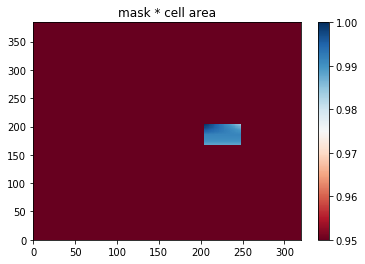

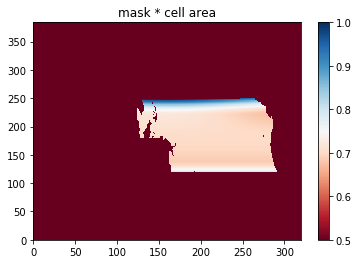

CPU times: user 6.39 s, sys: 613 ms, total: 7 s
Wall time: 7.01 s


In [10]:
%%time
#document: https://pop-tools.readthedocs.io/_/downloads/en/latest/pdf/
grid_name='POP_gx1v7'

#custom nino34 mask
region_defs = {
    'Nino_34': [
        {'match': {'REGION_MASK': [2]}, 'bounds': {'TLAT': [-5.0, 5.0], 'TLONG': [190.0, 240.0]}}]
}

mask3d_nino34 = pop_tools.region_mask_3d(grid_name, region_defs=region_defs, mask_name='ENSO34')
mask3d_nino34 = np.array(mask3d_nino34).squeeze()


ds_ocean = pop_tools.get_grid(grid_name)
region_masks = pop_tools.list_region_masks(grid_name)
region_masks
mask3d = pop_tools.region_mask_3d(grid_name, mask_name='default')
Trop_Pacific_Mask=np.array(pop_tools.region_mask_3d(grid_name, mask_name='lat-range-basin'))[6,:,:].squeeze()



nino34_Mask = np.array(pop_tools.region_mask_3d(grid_name, region_defs=region_defs, mask_name='ENSO34')).squeeze()
plt.pcolor((nino34_Mask)*(cell_area/np.max(cell_area*nino34_Mask)),cmap='RdBu',vmin=0.95,vmax=1)
plt.title('mask * cell area')
plt.colorbar()
plt.show()

plt.pcolor((Trop_Pacific_Mask)*(cell_area/np.max(cell_area*Trop_Pacific_Mask)),cmap='RdBu',vmin=0.5,vmax=1)
plt.title('mask * cell area')
plt.colorbar()
plt.show()

In [11]:
%%time
ds_CTRL_monthly = dsets["ocn.CTRL.monthly"]
monthly = ds_CTRL_monthly.groupby('time.month').mean(dim='time') #remove the monthly average
ds_CTRL_monthly_anom = ds_CTRL_monthly.groupby('time.month') - monthly
print('...Done with Anomaly Calc...')
# ds_CTRL_monthly_anom = ds_CTRL_monthly_anom.sel(nlat=slice(15,-15),nlon=slice(150,280)) # select lat/lon region 
# print('...Subset Region...')
months =  [1,2,3,4,5,6,7,8,9,10,11,12] # for example grabs Dec,Jan,Feb,Mar
ds_CTRL_monthly_anom  =  ds_CTRL_monthly_anom.sel(time = np.in1d(ds_CTRL_monthly_anom['time.month'], months)).squeeze()
# print('...Subset Months of Interest...')
# print('....done...')
ds_CTRL_monthly_anom = ds_CTRL_monthly_anom.sel(time=slice("0500-01-02", "0999-12-31")) # cut down on time so hopefully it loads

/glade/work/wchapman/miniconda3/envs/APSss/lib/python3.6/site-packages/xarray/core/indexing.py:1343: PerformanceWarning: Slicing with an out-of-order index is generating 901 times more chunks
  return self.array[key]
/glade/work/wchapman/miniconda3/envs/APSss/lib/python3.6/site-packages/xarray/core/indexing.py:1343: PerformanceWarning: Slicing with an out-of-order index is generating 25 times more chunks
  return self.array[key]


...Done with Anomaly Calc...
CPU times: user 786 ms, sys: 16.8 ms, total: 802 ms
Wall time: 819 ms


In [15]:
np.array(np.mean(SST[:,20,20]))


/glade/work/wchapman/miniconda3/envs/APSss/lib/python3.6/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


array(-0.00086402, dtype=float32)

## Anomaly Time Series in ENSO region
This is done by month... in the defined region

In [12]:
%%time
print('...getting data...')
SST = ds_CTRL_monthly_anom['SST'].data
nino34_Mask[nino34_Mask==0]=np.nan #makes nan mask
print('...masking ...')
sst=SST*np.expand_dims(nino34_Mask,axis=0)*np.expand_dims(cell_area/np.max(cell_area*nino34_Mask),axis=0)
print('...grabbing array...')
sst = np.array(sst)
NINO34 = np.nanmean(sst,axis=(1,2))
print('making datas')
print('...making DS...')
NinoDS = xr.Dataset(
    {
        "Nino34": (["time"], NINO34),
    },
    coords={
        "time": ds_CTRL_monthly_anom.time.data,
    },
)
print('....saving....')
NinoDS.to_netcdf('/glade/work/wchapman/ASP_summerschool/datasets/NINO34_monthly_500_999.nc')

...getting data...
...masking ...
...grabbing array...


/glade/work/wchapman/miniconda3/envs/APSss/lib/python3.6/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


making datas
...making DS...
....saving....
CPU times: user 42.7 s, sys: 21.9 s, total: 1min 4s
Wall time: 40.6 s


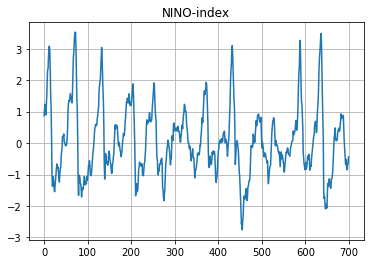

In [109]:
plt.plot(NINO34[0:700])
plt.grid(True)
plt.title('NINO-index')
plt.show()

In [20]:
np.mean(NINO34)

0.03968320603076778

## Now do an EOF
probably just do december jan feb march

In [17]:
%%time
SST = DSsst['SST'].data
sst=SST*np.expand_dims(Trop_Pacific_Mask,axis=0)*np.expand_dims(cell_area/np.max(cell_area*Trop_Pacific_Mask),axis=0)
sst_flat = np.reshape(sst,[sst.shape[0],-1])
#get nan locations: 
nan_flat = np.where(np.isnan(sst_flat[0,:]))[0]
notnan_flat = np.where(~np.isnan(sst_flat[0,:]))[0]
#get 0 locations
zero_flat = np.where(sst_flat[0,:]==0)[0]
#get value locations 
notzero_flat = np.where(np.ndarray.flatten(Trop_Pacific_Mask)==1)[0]

print('...forming smaller matrix...')
eof_sst = np.zeros([sst_flat.shape[0],notzero_flat.shape[0]])

for ii in range(eof_sst.shape[0]):
    eof_sst[ii,:]=sst_flat[ii,notzero_flat]
    
print('...done preprocessing...')


...forming smaller matrix...
...done preprocessing...
CPU times: user 2.53 s, sys: 2.65 s, total: 5.18 s
Wall time: 5.18 s


## Making EOF

...starting svd...
...done svd...


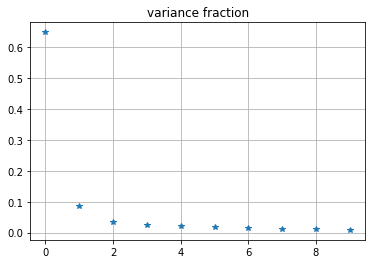

CPU times: user 13min 15s, sys: 3min 33s, total: 16min 48s
Wall time: 4min 8s


In [18]:
%%time
dFIN = eof_sst #hopefully this is a time x space anomaly matrix... where time is shorter than space. 
print('...starting svd...')
A, Lh, E = np.linalg.svd(dFIN.T,full_matrices=False)
# Singular values are the square-root of the eigenvalues of the
# covariance matrix. Construct the eigenvalues appropriately and
# normalize by N-ddof where N is the number of observations. This
# corresponds to the eigenvalues of the normalized covariance matrix.
print('...done svd...')
ddof = 1 #degrees of freedom. 
records = dFIN.shape[0]
normfactor = float(records-ddof)
L = Lh*Lh / normfactor  #singular values
# Store the number of eigenvalues (and hence EOFs) that were actually computed.
neofs = len(L)

P = E.T*Lh
P = P/np.sqrt(L) #scaled to unit variance (e.g., divided by the square-root of their eigenvalue).
A = A.T
#variance fraction 
varfrac = L/L.sum()
total_anomaly_variance = L.sum()
#variance fraction 
plt.plot(varfrac[:10],'*')
plt.grid(True)
plt.title('variance fraction')
plt.show()

...Done...
Fraction of Nino years: 0.1701832315380344
Fraction of Nina years: 0.15491393670183232
Fraction of Neurtral years: 0.6749028317601332
sum: 1.0


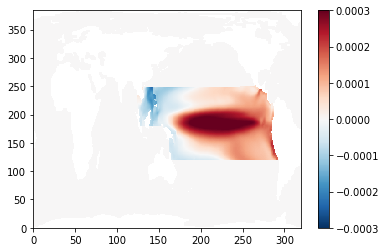

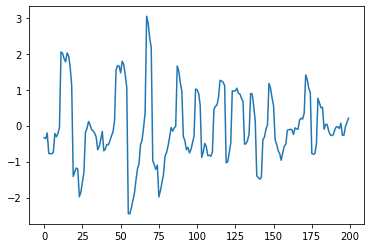

CPU times: user 1.62 s, sys: 176 ms, total: 1.79 s
Wall time: 1.71 s


,Month,Year,ENSO
0,1,400,-0.336100
1,2,400,-0.361738
2,3,400,-0.204644
3,12,400,-0.774765
4,1,401,-0.779649
5,2,401,-0.785348
6,3,401,-0.739361
7,12,401,-0.219926
8,1,402,-0.307420
9,2,402,-0.219585


In [19]:
%%time
#grab the eof you want. 
eof_number = 0
Pcs = P[:,eof_number]
eofs = A[eof_number,:]/ np.sqrt(L[eof_number]) 

##reform pattern. 
mapss = np.zeros([sst_flat[0,:].shape[0]]) 
mapss[nan_flat] = np.nan
mapss[notzero_flat] = eofs


#make sure pattern is positive oriented. 
if np.sum(eofs)<0:
    eofs = -1*eofs
    Pcs = -1*Pcs

mapss = np.reshape(mapss,[Trop_Pacific_Mask.shape[0],Trop_Pacific_Mask.shape[1]])

print('...Done...')
print('Fraction of Nino years:',np.sum(Pcs>=1)/len(Pcs))
print('Fraction of Nina years:',np.sum(Pcs<=-1)/len(Pcs))
print('Fraction of Neurtral years:',np.sum((Pcs>=-1) &(Pcs<=1))/len(Pcs))
print('sum:',np.sum(Pcs>=1)/len(Pcs) + np.sum(Pcs<=-1)/len(Pcs) + np.sum((Pcs>=-1) &(Pcs<=1))/len(Pcs))

plt.pcolor(mapss,cmap='RdBu_r',vmin=-.0003,vmax=0.0003)
plt.colorbar()
plt.show()
plt.plot(Pcs[0:200])
plt.show()


NinoDS = xr.Dataset(
    {
        "ENSO": (["time"], Pcs),
    },
    coords={
        "time": ds_CTRL_monthly_anom.time.data,
    },
)
#pandas data frame
DFenso =pd.DataFrame({'Month':NinoDS['time.month'].data,'Year':NinoDS['time.year'].data,'ENSO':Pcs})
DFenso.head(10)

### Think about saving the Ocean SSTs 
but don't do it now.

## Atmosphere Daily Variables

In [13]:
# Define Xarray datasets corresponding to the three experiments
# ds_HIST = dsets["atm.HIST.monthly"]
# ds_20C = dsets["atm.20C.daily"]
# ds_RCP85 = dsets["atm.RCP85.daily"]
ds_CTRL_daily = dsets["atm.CTRL.daily"]

In [14]:
# My hacky solution to get around their bullshit
url = 's3://ncar-cesm-lens/atm/static/grid.zarr'
grid = xr.open_zarr(fsspec.get_mapper(url, anon=True), consolidated=True)

cell_area = grid.area.load()
total_area = cell_area.sum()
cell_area

<xarray.DataArray 'area' (lat: 192, lon: 288)>
array([[2.994837e+07, 2.994837e+07, 2.994837e+07, ..., 2.994837e+07,
        2.994837e+07, 2.994837e+07],
       [2.395748e+08, 2.395748e+08, 2.395748e+08, ..., 2.395748e+08,
        2.395748e+08, 2.395748e+08],
       [4.790848e+08, 4.790848e+08, 4.790848e+08, ..., 4.790848e+08,
        4.790848e+08, 4.790848e+08],
       ...,
       [4.790848e+08, 4.790848e+08, 4.790848e+08, ..., 4.790848e+08,
        4.790848e+08, 4.790848e+08],
       [2.395748e+08, 2.395748e+08, 2.395748e+08, ..., 2.395748e+08,
        2.395748e+08, 2.395748e+08],
       [2.994837e+07, 2.994837e+07, 2.994837e+07, ..., 2.994837e+07,
        2.994837e+07, 2.994837e+07]], dtype=float32)
Coordinates:
    P0       float64 1e+05
    area     (lat, lon) float32 29948370.0 29948370.0 ... 29948370.0 29948370.0
    gw       (lat) float64 3.382e-05 nan nan nan nan ... nan nan nan 3.382e-05
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
    ntrk     int32 1
    ntrm     int32 1
    ntrn     int32 1
    wnummax  (lat) int32 1 -2147483648 -2147483648 ... -2147483648 -2147483648 1
Attributes:
    long_name:      Grid-Cell Area
    standard_name:  cell_area
    units:          m2

## Heavy Lifting

In [64]:
ds_CTRL_daily

<xarray.Dataset>
Dimensions:    (lat: 192, lon: 288, member_id: 1, nbnd: 2, time: 36500)
Coordinates:
  * lat        (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * lon        (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * member_id  (member_id) int64 1
  * time       (time) object 0500-01-01 12:00:00 ... 0599-12-31 12:00:00
    time_bnds  (time, nbnd) object dask.array<chunksize=(36500, 1), meta=np.ndarray>
Dimensions without coordinates: nbnd
Data variables:
    PRECL      (member_id, time, lat, lon) float32 dask.array<chunksize=(1, 519, 192, 288), meta=np.ndarray>
    PSL        (member_id, time, lat, lon) float32 dask.array<chunksize=(1, 519, 192, 288), meta=np.ndarray>
    TS         (member_id, time, lat, lon) float32 dask.array<chunksize=(1, 519, 192, 288), meta=np.ndarray>
Attributes:
    case:                      b.e11.B1850C5CN.f09_g16.005
    topography_file:           /glade/p/cesm/cseg//inputdata/atm/cam/topo/USG...
    intake_esm_varname:        TS
    logname:                   mai
    initial_file:              /glade/p/cesm/cseg//inputdata/atm/cam/inic/fv/...
    Conventions:               CF-1.0
    source:                    CAM
    Version:                   $Name$
    title:                     UNSET
    revision_Id:               $Id$
    nco_openmp_thread_number:  1
    NCO:                       4.3.4
    intake_esm_dataset_key:    atm.CTRL.daily

## load daily by year

In [65]:
%%time
ds_CTRL_daily = dsets["atm.CTRL.daily"]

#slice by time first
ds_CTRL_daily = ds_CTRL_daily.sel(time=slice("0500-01-01", "0599-12-31")) # cut down on time so hopefully it loads faster

# monthly = ds_CTRL_daily.groupby('time.month').mean(dim='time') #remove the monthly average


# ds_CTRL_daily_anom = ds_CTRL_daily.groupby('time.month') - monthly
# print('...Done with Anomaly Calc...')


# ds_CTRL_weekly_anom = ds_CTRL_daily_anom.resample(time ='7D').mean() #7day mean 
# print('...Done with weekly averaging ...')

# ds_CTRL_weekly_anom = ds_CTRL_weekly_anom.sel(lat=slice(15,90),lon=slice(170,315)) # select lat/lon region 
# print('...Subset Region...')


# # months =  [12,1,2,3] # for example grabs Dec,Jan,Feb,Mar
# # ds_CTRL_weekly_anom  =  ds_CTRL_weekly_anom.sel(time = np.in1d(ds_CTRL_weekly_anom['time.month'], months)).squeeze()
# print('....done...')

####

CPU times: user 12 ms, sys: 166 µs, total: 12.1 ms
Wall time: 11 ms


<xarray.Dataset>
Dimensions:    (lat: 192, lon: 288, member_id: 1, nbnd: 2, time: 18615)
Coordinates:
  * lat        (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * member_id  (member_id) int64 1
  * lon        (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time       (time) object 0500-01-01 12:00:00 ... 0550-12-31 12:00:00
    time_bnds  (time, nbnd) object 0500-01-01 00:00:00 ... 0551-01-01 00:00:00
    month      (time) int64 1 1 1 1 1 1 1 1 1 1 ... 12 12 12 12 12 12 12 12 12
Dimensions without coordinates: nbnd
Data variables:
    PRECL      (member_id, time, lat, lon) float32 -9.924601e-10 ... -4.115508e-09
    PSL        (member_id, time, lat, lon) float32 24.445312 ... 1386.5859
    TS         (member_id, time, lat, lon) float32 -0.23049927 ... -5.2000427

In [100]:
%%time 
####
ds_CTRL_daily.load()

CPU times: user 36.9 s, sys: 23.5 s, total: 1min
Wall time: 1min 6s


<xarray.Dataset>
Dimensions:    (lat: 192, lon: 288, member_id: 1, nbnd: 2, time: 36500)
Coordinates:
  * lat        (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * lon        (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * member_id  (member_id) int64 1
  * time       (time) object 0500-01-01 12:00:00 ... 0599-12-31 12:00:00
    time_bnds  (time, nbnd) object 0500-01-01 00:00:00 ... 0600-01-01 00:00:00
Dimensions without coordinates: nbnd
Data variables:
    PRECL      (member_id, time, lat, lon) float32 6.5579625e-12 ... 1.1505095e-09
    PSL        (member_id, time, lat, lon) float32 99940.82 ... 103247.94
    TS         (member_id, time, lat, lon) float32 239.1956 ... 237.5939
Attributes:
    case:                      b.e11.B1850C5CN.f09_g16.005
    topography_file:           /glade/p/cesm/cseg//inputdata/atm/cam/topo/USG...
    intake_esm_varname:        TS
    logname:                   mai
    initial_file:              /glade/p/cesm/cseg//inputdata/atm/cam/inic/fv/...
    Conventions:               CF-1.0
    source:                    CAM
    Version:                   $Name$
    title:                     UNSET
    revision_Id:               $Id$
    nco_openmp_thread_number:  1
    NCO:                       4.3.4
    intake_esm_dataset_key:    atm.CTRL.daily

## Fit and Remove the Seasonal Cycle
fitting first 8 harmonics... this is the heavy lifting.

In [252]:
#this speeds it up a little bit
class BarebonesLinearRegression(linear_model.LinearRegression):

    def predict_single(self, x):
        return np.dot(self.coef_, x) + self.intercept_

In [265]:
%%time


ts = [500,600,700,800,900]

for t in ts:
    print('doing:',str(t))
    
    print('...loading...')
    ds_CTRL_daily = dsets["atm.CTRL.daily"]

    #slice by time first
    sl1 = '0'+str(t)+'-01-01'
    sl2 = '0'+str(t+99)+'-12-31'
    ds_CTRL_daily = ds_CTRL_daily.sel(time=slice(sl1, sl2)) # cut down on time so hopefully it loads faster
    ds_CTRL_daily.load()
    
    print('go grab coffee... this takes a while')
    #create X fit array. 
    dayz = 365 
    bias = np.ones([dayz])
    harm1s = np.sin(np.linspace(0,1*np.pi,365))
    harm1c = np.cos(np.linspace(0,1*np.pi,365))
    harm2s = np.sin(np.linspace(0,2*np.pi,365))
    harm2c = np.cos(np.linspace(0,2*np.pi,365))
    harm3s = np.sin(np.linspace(0,3*np.pi,365))
    harm3c = np.cos(np.linspace(0,3*np.pi,365))
    harm4s = np.sin(np.linspace(0,4*np.pi,365))
    harm4c = np.cos(np.linspace(0,4*np.pi,365))
    harm5s = np.sin(np.linspace(0,5*np.pi,365))
    harm5c = np.cos(np.linspace(0,5*np.pi,365))
    harm6s = np.sin(np.linspace(0,6*np.pi,365))
    harm6c = np.cos(np.linspace(0,6*np.pi,365))
    harm7s = np.sin(np.linspace(0,7*np.pi,365))
    harm7c = np.cos(np.linspace(0,7*np.pi,365))
    harm8s = np.sin(np.linspace(0,8*np.pi,365))
    harm8c = np.cos(np.linspace(0,8*np.pi,365))

    Xmat_1year = np.concatenate([bias[None,...],
                             harm1s[None,...],harm1c[None,...],
                             harm2s[None,...],harm2c[None,...],
                             harm3s[None,...],harm3c[None,...],
                             harm4s[None,...],harm4c[None,...],
                             harm5s[None,...],harm5c[None,...],
                             harm6s[None,...],harm6c[None,...],
                             harm7s[None,...],harm7c[None,...],
                             harm8s[None,...],harm8c[None,...],],axis=0)


    Xmat = np.tile(Xmat_1year,int(ds_CTRL_daily['TS'].shape[1]/365))

    TS = np.array(ds_CTRL_daily['TS']).squeeze()
    PSL =  np.array(ds_CTRL_daily['PSL']).squeeze()
    PRECL = np.array(ds_CTRL_daily['PRECL']).squeeze()

    regr = BarebonesLinearRegression()
    TS_anom=np.zeros_like(TS)
    PSL_anom=np.zeros_like(PSL)
    PRECL_anom=np.zeros_like(PRECL)

    print('...fitting in Global loop, counting towards:192...')
    lat = np.array(ds_CTRL_daily['lat'].data)
    lon = np.array(ds_CTRL_daily['lon'].data)
    for lala in range(lat.shape[0]):
        if lala % 10 ==0:
            print('latitude iteration:', lala)
        for lolo in range(lon.shape[0]):        
            TS_ts = regr.fit(Xmat.T,TS[:,lala,lolo])
            TS_anom[:,lala,lolo] = TS[:,lala,lolo]-TS_ts.predict_single(Xmat)
        
            PSL_ts = regr.fit(Xmat.T,PSL[:,lala,lolo])
            PSL_anom[:,lala,lolo] = PSL[:,lala,lolo]-PSL_ts.predict_single(Xmat)
        
            PRECL_ts = regr.fit(Xmat.T,PRECL[:,lala,lolo])
            PRECL_anom[:,lala,lolo] = PRECL[:,lala,lolo]-PRECL_ts.predict_single(Xmat)

    PSL_anom=np.expand_dims(PSL_anom,axis=0)
    PRECL_anom=np.expand_dims(PRECL_anom,axis=0)
    TS_anom=np.expand_dims(TS_anom,axis=0)
    ds_CTRL_daily['PSL_anom']=(['member_id', 'time', 'lat','lon'],PSL_anom)        
    ds_CTRL_daily['TS_anom']=(['member_id', 'time', 'lat','lon'],TS_anom)
    ds_CTRL_daily['PRECL_anom']=(['member_id', 'time', 'lat','lon'],PRECL_anom)
    
    print('saving')
    save_name='/glade/scratch/wchapman/ASP_summerschool/datsets/Daily_Global_LENS_CTRL_PSL_TS_PRECL_'+str(t)+'_'+str(t+99)+'.nc'
    ds_CTRL_daily.to_netcdf(save_name)
    
    ds_daily_rolling = ds_CTRL_daily.rolling(time=7,center=True).mean()
    save_name='/glade/scratch/wchapman/ASP_summerschool/datsets/Daily_Rolling7day_Global_LENS_CTRL_PSL_TS_PRECL_'+str(t)+'_'+str(t+99)+'.nc'
    ds_daily_rolling.to_netcdf(save_name)
    
    ds_CTRL_weekly = ds_CTRL_daily.resample(time ='7D').mean() #7day mean 
    save_name='/glade/scratch/wchapman/ASP_summerschool/datsets/Weekly_Global_LENS_CTRL_PSL_TS_PRECL_'+str(t)+'_'+str(t+99)+'.nc'
    ds_CTRL_weekly.to_netcdf(save_name)

doing: 500
...loading...
go grab coffee... this takes a while
...fitting in Global loop, counting towards:192...
latitude iteration: 0
latitude iteration: 10
latitude iteration: 20
latitude iteration: 30
latitude iteration: 40
latitude iteration: 50
latitude iteration: 60
latitude iteration: 70
latitude iteration: 80
latitude iteration: 90
latitude iteration: 100
latitude iteration: 110
latitude iteration: 120
latitude iteration: 130
latitude iteration: 140
latitude iteration: 150
latitude iteration: 160
latitude iteration: 170
latitude iteration: 180
latitude iteration: 190
saving
doing: 600
...loading...
go grab coffee... this takes a while
...fitting in Global loop, counting towards:192...
latitude iteration: 0
latitude iteration: 10
latitude iteration: 20
latitude iteration: 30
latitude iteration: 40
latitude iteration: 50
latitude iteration: 60
latitude iteration: 70
latitude iteration: 80
latitude iteration: 90
latitude iteration: 100
latitude iteration: 110
latitude iteration: 1

## Build Rolling 7day mean files

In [266]:
%%time

ts = [500,600,700,800,900]

for t in ts:
    print('doing:',str(t))
    
    save_name='/glade/scratch/wchapman/ASP_summerschool/datsets/Daily_Global_LENS_CTRL_PSL_TS_PRECL_'+str(t)+'_'+str(t+99)+'.nc'
    print('rolling:',save_name)
    ds_CTRL_daily=xr.open_dataset(save_name)
    ds_daily_rolling = ds_CTRL_daily.rolling(time=7,center=True).mean()
    print('....saving...')
    save_name='/glade/scratch/wchapman/ASP_summerschool/datsets/Daily_Rolling7day_Global_LENS_CTRL_PSL_TS_PRECL_'+str(t)+'_'+str(t+99)+'.nc'
    ds_daily_rolling.to_netcdf(save_name)

doing: 500
rolling: /glade/scratch/wchapman/ASP_summerschool/datsets/Daily_Global_LENS_CTRL_PSL_TS_PRECL_500_599.nc
....saving...
doing: 600
rolling: /glade/scratch/wchapman/ASP_summerschool/datsets/Daily_Global_LENS_CTRL_PSL_TS_PRECL_600_699.nc
....saving...
doing: 700
rolling: /glade/scratch/wchapman/ASP_summerschool/datsets/Daily_Global_LENS_CTRL_PSL_TS_PRECL_700_799.nc
....saving...
doing: 800
rolling: /glade/scratch/wchapman/ASP_summerschool/datsets/Daily_Global_LENS_CTRL_PSL_TS_PRECL_800_899.nc
....saving...
doing: 900
rolling: /glade/scratch/wchapman/ASP_summerschool/datsets/Daily_Global_LENS_CTRL_PSL_TS_PRECL_900_999.nc
....saving...
CPU times: user 42min 47s, sys: 40min 37s, total: 1h 23min 24s
Wall time: 1h 26min 54s


In [209]:
%%time
ds_CTRL_daily.to_netcdf('/glade/scratch/wchapman/ASP_summerschool/datsets/Daily_Global_LENS_CTRL_PSL_TS_PRECL_500_599.nc')

CPU times: user 6.66 s, sys: 12.1 s, total: 18.8 s
Wall time: 19.6 s


## Resample to make weekly.

In [211]:
%%time
ds_CTRL_weekly = ds_CTRL_daily.resample(time ='7D').mean() #7day mean 

CPU times: user 39.6 s, sys: 4.8 s, total: 44.4 s
Wall time: 44.3 s


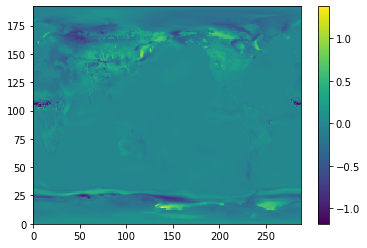

In [219]:
ds =ds_CTRL_weekly
monthly_data = ds.sel(time=is_feb(ds['time.month']))
bb = np.array(monthly_data['TS_anom']).squeeze()
np.mean(bb,axis=0)

plt.pcolor(np.mean(bb,axis=0))
plt.colorbar()

In [32]:
%%time
ds_CTRL_daily_anom.load()

CPU times: user 51 µs, sys: 11 µs, total: 62 µs
Wall time: 65.8 µs


<xarray.Dataset>
Dimensions:    (lat: 192, lon: 288, member_id: 1, nbnd: 2, time: 18615)
Coordinates:
  * lat        (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * member_id  (member_id) int64 1
  * lon        (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time       (time) object 0500-01-01 12:00:00 ... 0550-12-31 12:00:00
    time_bnds  (time, nbnd) object 0500-01-01 00:00:00 ... 0551-01-01 00:00:00
    month      (time) int64 1 1 1 1 1 1 1 1 1 1 ... 12 12 12 12 12 12 12 12 12
Dimensions without coordinates: nbnd
Data variables:
    PRECL      (member_id, time, lat, lon) float32 -9.924601e-10 ... -4.115508e-09
    PSL        (member_id, time, lat, lon) float32 24.445312 ... 1386.5859
    TS         (member_id, time, lat, lon) float32 -0.23049927 ... -5.2000427

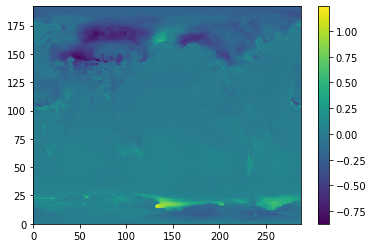

In [30]:
ds =ds_CTRL_weekly_anom
monthly_data = ds.sel(time=is_feb(ds['time.month']))
bb = np.array(monthly_data['TS']).squeeze()
np.mean(bb,axis=0)

plt.pcolor(np.mean(bb,axis=0))
plt.colorbar()

In [36]:
bb = np.array(ds_CTRL_weekly_anom['TS']).squeeze()

-7.08575e-05

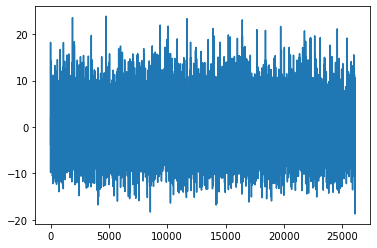

In [46]:
plt.plot(bb[:,40,100])
np.mean(bb[:,40,100])

In [76]:
def is_feb(month):
    return (month==6)

ds =ds_CTRL_weekly_anom
monthly_data = ds.sel(time=is_feb(ds['time.month']))
bb = np.array(monthly_data['TS']).squeeze()
np.mean(bb[:,34,56])

0.052973334

In [51]:
monthly_data

<xarray.Dataset>
Dimensions:    (lat: 80, lon: 117, member_id: 1, time: 2000)
Coordinates:
  * time       (time) object 0500-02-05 00:00:00 ... 0999-02-24 00:00:00
  * member_id  (member_id) int64 1
  * lon        (lon) float64 170.0 171.2 172.5 173.8 ... 311.2 312.5 313.8 315.0
  * lat        (lat) float64 15.55 16.49 17.43 18.38 ... 87.17 88.12 89.06 90.0
Data variables:
    PRECL      (time, member_id, lat, lon) float32 3.0177663e-10 ... 5.0755213e-09
    PSL        (time, member_id, lat, lon) float32 -22.328125 ... -783.8125
    TS         (time, member_id, lat, lon) float32 0.04332188 ... 2.1540418

In [55]:
bb = np.array(monthly_data['TS']).squeeze()

-0.009628822

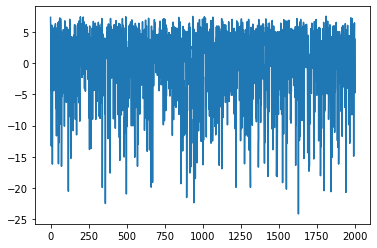

In [60]:
plt.plot(bb[:,40,50])
np.mean(bb[:,40,50])

In [61]:
ds_CTRL_weekly_anom.to_netcdf('/glade/scratch/wchapman/ASP_summerschool/datsets/weekly_North_America_LENS_CTRL_anom_PSL_TS_PRECL_500_999.nc')

In [54]:
ds_CTRL_weekly_anom.time

<xarray.DataArray 'time' (time: 26072)>
array([cftime.DatetimeNoLeap(500, 1, 1, 0, 0, 0, 0, 3, 1),
       cftime.DatetimeNoLeap(500, 1, 8, 0, 0, 0, 0, 3, 8),
       cftime.DatetimeNoLeap(500, 1, 15, 0, 0, 0, 0, 3, 15), ...,
       cftime.DatetimeNoLeap(999, 12, 15, 0, 0, 0, 0, 3, 349),
       cftime.DatetimeNoLeap(999, 12, 22, 0, 0, 0, 0, 3, 356),
       cftime.DatetimeNoLeap(999, 12, 29, 0, 0, 0, 0, 3, 363)], dtype=object)
Coordinates:
  * time     (time) object 0500-01-01 00:00:00 ... 0999-12-29 00:00:00

## The 7-day time vector will be very handy can we just get that? 

In [52]:
%%time
daily_timeDS = ds_CTRL_daily.drop(['PRECL','PSL','TS']).squeeze()
weekly_timeDS = daily_timeDS.resample(time ='7D').mean() #7day mean 
DFalltimes = pd.DataFrame({'Year':weekly_timeDS['time.year'],'Month':weekly_timeDS['time.month'],'Day':weekly_timeDS['time.day']})

CPU times: user 1min 29s, sys: 818 ms, total: 1min 29s
Wall time: 1min 29s


In [53]:
DFalltimes

,Year,Month,Day
0,402,1,1
1,402,1,8
2,402,1,15
3,402,1,22
4,402,1,29
...,...,...,...
93800,2200,11,27
93801,2200,12,4
93802,2200,12,11
93803,2200,12,18


## Calculate Quantiles for Every Variable.

In [42]:
%%time
qt_dims = ("time")
qt_values = (0.3333333, 0.66666)
ds_qt = ds_CTRL_weekly_anom.quantile(qt_values, dim=qt_dims)

CPU times: user 9.61 s, sys: 20.7 ms, total: 9.63 s
Wall time: 9.65 s


## Control the process with a forecast DataFrame

In [24]:
%%time
#pandas data frame
DFforecast =pd.DataFrame({'Month':ds_CTRL_weekly_anom['time.month'].data,'Year':ds_CTRL_weekly_anom['time.year'].data,'Day':ds_CTRL_weekly_anom['time.day']})

ENSOind = []
for bb in range(DFforecast.shape[0]):
    mo = DFforecast.Month[bb]
    yr = DFforecast.Year[bb]
    ENSOind.append(np.array(DFenso[(DFenso['Month']==mo)&(DFenso['Year']==yr)]['ENSO'])[0])
    
DFforecast['ENSO']=ENSOind
DFforecast.head(10)

CPU times: user 31.7 s, sys: 119 ms, total: 31.8 s
Wall time: 31.9 s


,Month,Year,Day,ENSO
0,1,402,1,-0.307420
1,1,402,8,-0.307420
2,1,402,15,-0.307420
3,1,402,22,-0.307420
4,1,402,29,-0.307420
5,2,402,5,-0.219585
6,2,402,12,-0.219585
7,2,402,19,-0.219585
8,2,402,26,-0.219585
9,3,402,5,-0.060944


## Continue your journey to dataframe perfection

In [25]:
%%time
Lead=3
forecastMonth=[]
forecastYear=[]
forecastDay=[]
ind_forecast=[]

for ii in range(DFforecast.shape[0]):
    mo = DFforecast['Month'][ii]
    yr = DFforecast['Year'][ii]
    da = DFforecast['Day'][ii]
    leadind = DFalltimes[(DFalltimes['Month']==mo)&(DFalltimes['Year']==yr)&(DFalltimes['Day']==da)].index[0]+Lead
    
    if leadind < DFalltimes.shape[0]:
        forecastMonth.append(DFalltimes['Month'][leadind])
        forecastDay.append(DFalltimes['Day'][leadind])
        forecastYear.append(DFalltimes['Year'][leadind])
    else: 
        print('....done...?')
        forecastMonth.append(-999)
        forecastDay.append(-999)
        forecastYear.append(-999)
        
    
    if leadind >= DFalltimes.shape[0]:
        ind_forecast.append(-999)
    elif (DFforecast[(DFforecast['Month']==DFalltimes['Month'][leadind]) & (DFforecast['Day']==DFalltimes['Day'][leadind]) & (DFforecast['Year']==DFalltimes['Year'][leadind])].shape[0] ==0):
        ind_forecast.append(-999)
    elif DFforecast[(DFforecast['Month']==DFalltimes['Month'][leadind]) & (DFforecast['Day']==DFalltimes['Day'][leadind]) & (DFforecast['Year']==DFalltimes['Year'][leadind])].shape[0] ==1:
        ind_forecast.append(DFforecast[(DFforecast['Month']==DFalltimes['Month'][leadind]) & (DFforecast['Day']==DFalltimes['Day'][leadind]) & (DFforecast['Year']==DFalltimes['Year'][leadind])].index[0])
    else:
        print('ohhh shit')
        
#append this to the data forecast. 
DFforecast['Month_3lead'] = forecastMonth
DFforecast['Year_3lead'] = forecastYear
DFforecast['Day_3lead'] = forecastDay
DFforecast['Ind_3lead'] = ind_forecast

#drop any forecasts verifying in april. Remove from ALLL datasets. ~ 5400 forecasts. 
verifApril = DFforecast[DFforecast['Month_3lead']==4].index
DFforecast.iloc[verifApril]

....done...?
....done...?
....done...?
CPU times: user 2min 52s, sys: 647 ms, total: 2min 53s
Wall time: 2min 53s


,Month,Year,Day,ENSO,Month_3lead,Year_3lead,Day_3lead,Ind_3lead
10,3,402,12,-0.060944,4,402,2,-999
11,3,402,19,-0.060944,4,402,9,-999
12,3,402,26,-0.060944,4,402,16,-999
27,3,403,11,1.774082,4,403,1,-999
28,3,403,18,1.774082,4,403,8,-999
...,...,...,...,...,...,...,...,...
31074,3,2199,21,0.798061,4,2199,11,-999
31075,3,2199,28,0.798061,4,2199,18,-999
31090,3,2200,13,0.347602,4,2200,3,-999
31091,3,2200,20,0.347602,4,2200,10,-999


## Test a Forecast JUST for Seattle. 

In [26]:
%%time
Seattle = ds_CTRL_weekly_anom.sel(lat=49,lon=240,method='nearest')
Seattleqt = ds_qt.sel(lat=49,lon=240,method='nearest')

yhat=[]
verified =[]

sixsix = float(Seattleqt.TS.sel(quantile=0.6666,method='nearest').data)
threethree = float(Seattleqt.TS.sel(quantile=0.3333,method='nearest').data)


#build it yearly rather than daily! 

for ii in range(Seattle.TS.shape[0]):
    
    if DFforecast['Ind_3lead'][ii] == -999:
        continue
    
    ENSO = DFforecast['ENSO'][ii]
    if ENSO > 1:
        forecastinds = np.array(DFforecast[DFforecast['ENSO']>1].Ind_3lead)
        forecastinds =  forecastinds[forecastinds!=DFforecast.iloc[ii].Ind_3lead]
        forecastinds =  forecastinds[forecastinds!=-999]
        forecastinds
    elif ENSO < -1:
        forecastinds = np.array(DFforecast[DFforecast['ENSO']<-1].Ind_3lead)
        forecastinds =  forecastinds[forecastinds!=DFforecast.iloc[ii].Ind_3lead]
        forecastinds =  forecastinds[forecastinds!=-999]
        forecastinds
    else:
        forecastinds = np.array(DFforecast[(DFforecast['ENSO']>=-1)&(DFforecast['ENSO']<=1)].Ind_3lead)
        forecastinds =  forecastinds[forecastinds!=DFforecast.iloc[ii].Ind_3lead]
        forecastinds =  forecastinds[forecastinds!=-999]
        forecastinds
        
    
    
    countabove = np.sum(np.array(Seattle.TS.isel(time=forecastinds))>sixsix)
    countbelow = np.sum(np.array(Seattle.TS.isel(time=forecastinds))<threethree)
    countbetween = len(forecastinds) - countabove - countbelow
    
    #guess
    yhat.append(np.argmax([countbelow,countbetween,countabove]))
    
    #ground truth
    verif_val=np.array(Seattle.TS[DFforecast['Ind_3lead'][ii]])
    verif_all =sorted([float(verif_val),threethree,sixsix])
    verified.append(verif_all.index(verif_val))
    
    
    
print(Seattleqt.TS.sel(quantile=0.3333,method='nearest').data)
print(Seattleqt.TS.sel(quantile=0.6666,method='nearest').data)

-1.3330056879136085
2.5854073992156983
CPU times: user 3min 1s, sys: 681 ms, total: 3min 2s
Wall time: 3min 2s


In [27]:
hits =0
for bb in range(len(verified)):
    hits+=np.sum(verified[bb] == yhat[bb])
    
HSS = (hits-(int(len(verified)*0.3333)))/(len(verified)-(int(len(verified)*0.3333)))*100
HSS

3.5253604155722873

## Cross Val- Leave out year

In [ ]:
%%time
lat = ds_CTRL_weekly_anom['lat'].data
lat = lat[-48:]
lon = ds_CTRL_weekly_anom['lon'].data
lon = lon[:]

#how many years? 
years_test =50

HSS_map = np.zeros([lat.shape[0],lon.shape[0]])

for lai,lala in enumerate(lat):
    print('lat:',lala)
    for loi,lolo in enumerate(lon):
        Seattle = ds_CTRL_weekly_anom.sel(lat=lala,lon=lolo,method='nearest')
        Seattleqt = ds_qt.sel(lat=lala,lon=lolo,method='nearest')

        yhat=[]
        verified =[]

        sixsix = float(Seattleqt.TS.sel(quantile=0.6666,method='nearest').data)
        threethree = float(Seattleqt.TS.sel(quantile=0.3333,method='nearest').data)
        #build it yearly rather than daily! 
        for ii,yrs in enumerate(np.unique(Seattle['time.year'])[-years_test:]):
    
            DFtest = DFforecast[(DFforecast['Year']==yrs) & (DFforecast['Ind_3lead']!=-999)]
            DFtrain = DFforecast[(DFforecast['Year']!=yrs) & (DFforecast['Ind_3lead']!=-999)]

            #neutral
            IndtrainNeutral= np.array(DFtrain[(DFtrain['ENSO']<1) & (DFtrain['ENSO']>-1)].Ind_3lead)
            countabove = np.sum(np.array(Seattle.TS.isel(time=IndtrainNeutral))>sixsix)
            countbelow = np.sum(np.array(Seattle.TS.isel(time=IndtrainNeutral))<threethree)
            countbetween = len(IndtrainNeutral) - countabove - countbelow
            ForNeut = np.argmax([countbelow,countbetween,countabove])

            #nina
            IndtrainNina=np.array(DFtrain[(DFtrain['ENSO']<=-1)].Ind_3lead)
            countabove = np.sum(np.array(Seattle.TS.isel(time=IndtrainNina))>sixsix)
            countbelow = np.sum(np.array(Seattle.TS.isel(time=IndtrainNina))<threethree)
            countbetween = len(IndtrainNina) - countabove - countbelow
            ForNina = np.argmax([countbelow,countbetween,countabove])

            #nino
            IndtrainNino= np.array(DFtrain[(DFtrain['ENSO']>=1)].Ind_3lead)
            countabove = np.sum(np.array(Seattle.TS.isel(time=IndtrainNino))>sixsix)
            countbelow = np.sum(np.array(Seattle.TS.isel(time=IndtrainNino))<threethree)
            countbetween = len(IndtrainNino) - countabove - countbelow
            ForNino = np.argmax([countbelow,countbetween,countabove])
    
            # yhat.append(np.argmax([countbelow,countbetween,countabove]))

            for nn,bb in enumerate(DFtest.ENSO):
                if bb <=-1:
                    yhat.append(ForNina)
                elif (bb>-1)&(bb<1):
                    yhat.append(ForNeut)
                elif (bb>=1):
                    yhat.append(ForNino)
        
                #ground truth
                verif_val=np.array(Seattle.TS[DFtest['Ind_3lead'].iloc[nn]])
                verif_all =sorted([float(verif_val),threethree,sixsix])
                verified.append(verif_all.index(verif_val))


    
#         print(Seattleqt.TS.sel(quantile=0.3333,method='nearest').data)
#         print(Seattleqt.TS.sel(quantile=0.6666,method='nearest').data)
    
        hits =0
        for bb in range(len(verified)):
            hits+=np.sum(verified[bb] == yhat[bb])
    
        HSS = (hits-(int(len(verified)*0.3333)))/(len(verified)-(int(len(verified)*0.3333)))*100
        HSS_map[lai,loi]=HSS
#         print('HSS:',HSS)

lat: 24.9738216400146
lat: 25.9162311553955
lat: 26.8586387634277
lat: 27.80104637146
lat: 28.7434558868408
lat: 29.685863494873
lat: 30.6282730102539
lat: 31.5706806182861
lat: 32.5130882263184
lat: 33.4554977416992
lat: 34.3979072570801
lat: 35.3403129577637
lat: 36.2827224731445
lat: 37.2251319885254
lat: 38.167537689209
lat: 39.1099472045898
lat: 40.0523567199707
lat: 40.9947662353516
lat: 41.9371719360352
lat: 42.879581451416
lat: 43.8219909667969
lat: 44.7643966674805
lat: 45.7068061828613
lat: 46.6492156982422
lat: 47.5916213989258
lat: 48.5340309143066
lat: 49.4764404296875
lat: 50.4188499450684


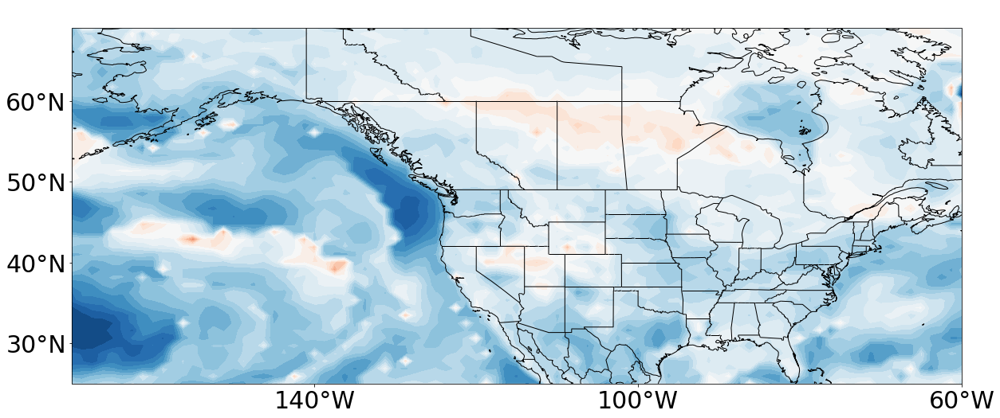

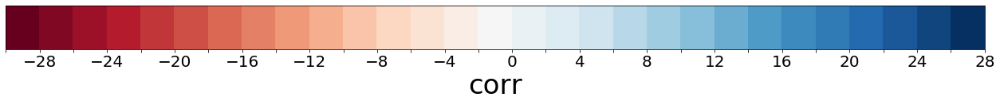

In [42]:
plot_field= HSS_map.squeeze()

plt.figure(figsize=(20, 20))
proj = ccrs.PlateCarree(central_longitude=180)
ax1 = plt.subplot(1, 1, 1, projection=proj)
ax1.coastlines('50m')

clevsHSS=np.arange(-30,30,2) 

haa = cm.get_cmap("Greys",len(clevsHSS))
haa = haa(np.linspace(0,1,len(clevsHSS)))
white=[1,1,1,1]
haa[:3,:] = white

#either do this 
cmap = copy.copy(mpl.cm.get_cmap("RdBu"))

#or set an ocean nanmask! 
nanmask = np.zeros_like(plot_field)+1


plt.contourf(lon-180, lat, (plot_field),levels=clevsHSS,
            cmap='RdBu', transform=proj)

# plt.contour(lon_pre-180, lat_pre, (plot_pre.T),[-8,-7,-6,-5,-4,-3,-2,-1,1,2,3,4,5,6,7,8], transform=proj,colors='k',linewidths=1.5)
# # plt.contour(lon_pre-180, lat_pre, (plot_pre.T),levels=[0,0.01], transform=proj,colors='k',linewidths=2)

# plt.contour(lon-180, lat,(uwnd_p),[45,50,60],colors='k',linewidths=3,linestyles='--',zorder=2)

# significant speckling
# siglats =[];
# siglons =[];
# for aa in range(len(lon)):
#     for bb in range(len(lat)):
#         if (((plot_field.squeeze())[aa,bb]<-7.5)):
#             siglons.append(lon[aa]-180)
#             siglats.append(lat[bb])

# plt.plot(siglons[::1],siglats[::1],'+',markersize=17,color='w',zorder=1)

# # significant speckling
# siglats =[];
# siglons =[];
# for aa in range(len(lon)):
#     for bb in range(len(lat)):
#         if (((plot_field.squeeze())[aa,bb]>7.5)):
#             siglons.append(lon[aa]-180)
#             siglats.append(lat[bb])

# plt.plot(siglons[::1],siglats[::1],'o',markersize=5,color='k')


# Q=ax1.quiver(XX[::wv,::wv], YY[::wv,::wv],uchi_field[::wv,::wv],vchi_field[::wv,::wv],color='k'
#            ,units='inches',scale=5,width=0.035,alpha=0.7,headwidth=2.4,zorder=2)
# qk = ax1.quiverkey(Q,0.9,1.03, 5, r'$ a$',fontproperties={'size': 23})


plt.plot([120-180,300-180],[0,0],color='k',linewidth=1,linestyle='--',zorder=1)

# lons = [130.3, 130.3, 299.7, 299.7]
# lats = [-15.5, 14.5, 14.5, -15.5]
# ring = LinearRing(list(zip(lons, lats)))
# ax1.add_geometries([ring], ccrs.PlateCarree(), facecolor='none', edgecolor='black',linewidth=5)

states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='10m',
        facecolor='none')

ax1.set_xticks([100,140,180,220,260,300,340], crs=ccrs.PlateCarree())
ax1.set_yticks(np.arange(-10,80,10), crs=ccrs.PlateCarree())

lon_formatter = LongitudeFormatter(zero_direction_label=True,number_format='.0f')
lat_formatter = LatitudeFormatter()
ax1.xaxis.set_major_formatter(lon_formatter)
ax1.yaxis.set_major_formatter(lat_formatter)
ax1.tick_params(labelsize=30) 
ax1.set_extent([190,300,25,69], crs=ccrs.PlateCarree())
ax1.add_feature(states_provinces, edgecolor='black')
ax1.add_feature(cartopy.feature.BORDERS,edgecolor='black')
plt.title(' ',fontsize=30)

# plt.savefig('/Volumes/HotSlop/Figures_for_SP/Figures/RWS.png', dpi=300,bbox_inches='tight')
plt.show()


# ############################################################################################
#                                         ####colorbar#####
# ############################################################################################
fig, ax = plt.subplots(figsize=(22, 2))
fig.subplots_adjust(bottom=0.5)

#set these features the same as above. 
cmap = copy.copy(mpl.cm.get_cmap("RdBu"))
bounds=clevsHSS

norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
cb2 = mpl.colorbar.ColorbarBase(ax, cmap=cmap,
                                norm=norm,
                                orientation='horizontal', extend='neither',
                                ticks=bounds)


cb2.ax.tick_params(labelsize=20) 
for label in cb2.ax.xaxis.get_ticklabels()[::2]:
    label.set_visible(False)
cb2.set_label('HSS',fontsize=34) 
# plt.savefig('/glade/work/wchapman/ECMWF_20C/Figures/colorbar.png', dpi=300,bbox_inches='tight')
plt.show()


## PSL

In [50]:
%%time
lat = ds_CTRL_weekly_anom['lat'].data
lat = lat[-48:]
lon = ds_CTRL_weekly_anom['lon'].data
lon = lon[:]

#how many years? 
years_test =50

HSS_map = np.zeros([lat.shape[0],lon.shape[0]])

for lai,lala in enumerate(lat):
    print('lat:',lala)
    for loi,lolo in enumerate(lon):
        Seattle = ds_CTRL_weekly_anom.sel(lat=lala,lon=lolo,method='nearest')
        Seattleqt = ds_qt.sel(lat=lala,lon=lolo,method='nearest')

        yhat=[]
        verified =[]

        sixsix = float(Seattleqt.PSL.sel(quantile=0.6666,method='nearest').data)
        threethree = float(Seattleqt.PSL.sel(quantile=0.3333,method='nearest').data)
        #build it yearly rather than daily! 
        for ii,yrs in enumerate(np.unique(Seattle['time.year'])[-years_test:]):
    
            DFtest = DFforecast[(DFforecast['Year']==yrs) & (DFforecast['Ind_3lead']!=-999)]
            DFtrain = DFforecast[(DFforecast['Year']!=yrs) & (DFforecast['Ind_3lead']!=-999)]

            #neutral
            IndtrainNeutral= np.array(DFtrain[(DFtrain['ENSO']<1) & (DFtrain['ENSO']>-1)].Ind_3lead)
            countabove = np.sum(np.array(Seattle.PSL.isel(time=IndtrainNeutral))>sixsix)
            countbelow = np.sum(np.array(Seattle.PSL.isel(time=IndtrainNeutral))<threethree)
            countbetween = len(IndtrainNeutral) - countabove - countbelow
            ForNeut = np.argmax([countbelow,countbetween,countabove])

            #nina
            IndtrainNina=np.array(DFtrain[(DFtrain['ENSO']<=-1)].Ind_3lead)
            countabove = np.sum(np.array(Seattle.PSL.isel(time=IndtrainNina))>sixsix)
            countbelow = np.sum(np.array(Seattle.PSL.isel(time=IndtrainNina))<threethree)
            countbetween = len(IndtrainNina) - countabove - countbelow
            ForNina = np.argmax([countbelow,countbetween,countabove])

            #nino
            IndtrainNino= np.array(DFtrain[(DFtrain['ENSO']>=1)].Ind_3lead)
            countabove = np.sum(np.array(Seattle.PSL.isel(time=IndtrainNino))>sixsix)
            countbelow = np.sum(np.array(Seattle.PSL.isel(time=IndtrainNino))<threethree)
            countbetween = len(IndtrainNino) - countabove - countbelow
            ForNino = np.argmax([countbelow,countbetween,countabove])
    
            # yhat.append(np.argmax([countbelow,countbetween,countabove]))

            for nn,bb in enumerate(DFtest.ENSO):
                if bb <=-1:
                    yhat.append(ForNina)
                elif (bb>-1)&(bb<1):
                    yhat.append(ForNeut)
                elif (bb>=1):
                    yhat.append(ForNino)
        
                #ground truth
                verif_val=np.array(Seattle.PSL[DFtest['Ind_3lead'].iloc[nn]])
                verif_all =sorted([float(verif_val),threethree,sixsix])
                verified.append(verif_all.index(verif_val))


    
#         print(Seattleqt.TS.sel(quantile=0.3333,method='nearest').data)
#         print(Seattleqt.TS.sel(quantile=0.6666,method='nearest').data)
    
        hits =0
        for bb in range(len(verified)):
            hits+=np.sum(verified[bb] == yhat[bb])
    
        HSS = (hits-(int(len(verified)*0.3333)))/(len(verified)-(int(len(verified)*0.3333)))*100
        HSS_map[lai,loi]=HSS
#         print('HSS:',HSS)

lat: 24.9738216400146
lat: 25.9162311553955
lat: 26.8586387634277
lat: 27.80104637146
lat: 28.7434558868408
lat: 29.685863494873
lat: 30.6282730102539
lat: 31.5706806182861
lat: 32.5130882263184
lat: 33.4554977416992
lat: 34.3979072570801
lat: 35.3403129577637
lat: 36.2827224731445
lat: 37.2251319885254
lat: 38.167537689209
lat: 39.1099472045898
lat: 40.0523567199707
lat: 40.9947662353516
lat: 41.9371719360352
lat: 42.879581451416
lat: 43.8219909667969
lat: 44.7643966674805
lat: 45.7068061828613
lat: 46.6492156982422
lat: 47.5916213989258
lat: 48.5340309143066
lat: 49.4764404296875
lat: 50.4188499450684
lat: 51.361255645752
lat: 52.3036651611328
lat: 53.2460746765137
lat: 54.1884803771973
lat: 55.1308898925781
lat: 56.073299407959
lat: 57.0157051086426
lat: 57.9581146240234
lat: 58.9005241394043
lat: 59.8429336547852
lat: 60.7853393554688
lat: 61.7277488708496
lat: 62.6701583862305
lat: 63.6125640869141
lat: 64.5549774169922
lat: 65.4973831176758
lat: 66.4397888183594
lat: 67.382202148

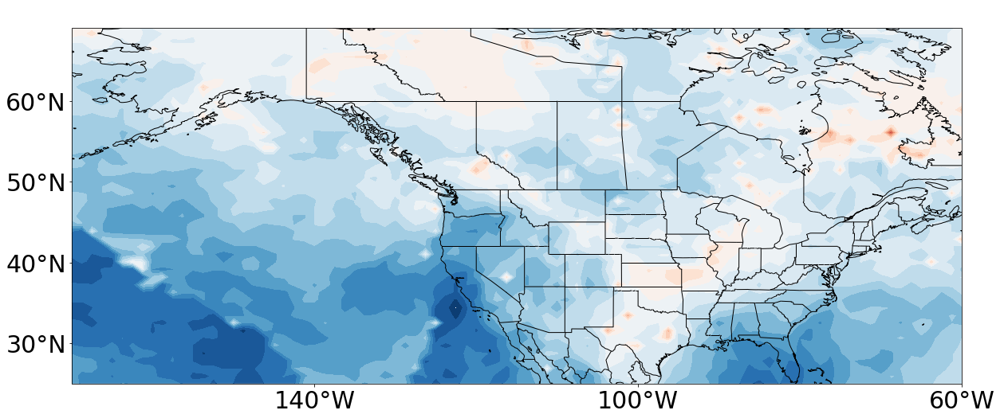

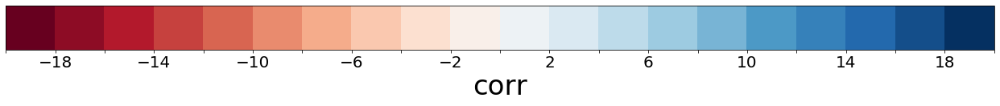

In [55]:
plot_field= HSS_map.squeeze()

plt.figure(figsize=(20, 20))
proj = ccrs.PlateCarree(central_longitude=180)
ax1 = plt.subplot(1, 1, 1, projection=proj)
ax1.coastlines('50m')

clevsHSS=np.arange(-20,22,2) 

haa = cm.get_cmap("Greys",len(clevsHSS))
haa = haa(np.linspace(0,1,len(clevsHSS)))
white=[1,1,1,1]
haa[:3,:] = white

#either do this 
cmap = copy.copy(mpl.cm.get_cmap("RdBu"))

#or set an ocean nanmask! 
nanmask = np.zeros_like(plot_field)+1


plt.contourf(lon-180, lat, (plot_field),levels=clevsHSS,
            cmap='RdBu', transform=proj)

# plt.contour(lon_pre-180, lat_pre, (plot_pre.T),[-8,-7,-6,-5,-4,-3,-2,-1,1,2,3,4,5,6,7,8], transform=proj,colors='k',linewidths=1.5)
# # plt.contour(lon_pre-180, lat_pre, (plot_pre.T),levels=[0,0.01], transform=proj,colors='k',linewidths=2)

# plt.contour(lon-180, lat,(uwnd_p),[45,50,60],colors='k',linewidths=3,linestyles='--',zorder=2)

# significant speckling
# siglats =[];
# siglons =[];
# for aa in range(len(lon)):
#     for bb in range(len(lat)):
#         if (((plot_field.squeeze())[aa,bb]<-7.5)):
#             siglons.append(lon[aa]-180)
#             siglats.append(lat[bb])

# plt.plot(siglons[::1],siglats[::1],'+',markersize=17,color='w',zorder=1)

# # significant speckling
# siglats =[];
# siglons =[];
# for aa in range(len(lon)):
#     for bb in range(len(lat)):
#         if (((plot_field.squeeze())[aa,bb]>7.5)):
#             siglons.append(lon[aa]-180)
#             siglats.append(lat[bb])

# plt.plot(siglons[::1],siglats[::1],'o',markersize=5,color='k')


# Q=ax1.quiver(XX[::wv,::wv], YY[::wv,::wv],uchi_field[::wv,::wv],vchi_field[::wv,::wv],color='k'
#            ,units='inches',scale=5,width=0.035,alpha=0.7,headwidth=2.4,zorder=2)
# qk = ax1.quiverkey(Q,0.9,1.03, 5, r'$ a$',fontproperties={'size': 23})


plt.plot([120-180,300-180],[0,0],color='k',linewidth=1,linestyle='--',zorder=1)

# lons = [130.3, 130.3, 299.7, 299.7]
# lats = [-15.5, 14.5, 14.5, -15.5]
# ring = LinearRing(list(zip(lons, lats)))
# ax1.add_geometries([ring], ccrs.PlateCarree(), facecolor='none', edgecolor='black',linewidth=5)

states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='10m',
        facecolor='none')

ax1.set_xticks([100,140,180,220,260,300,340], crs=ccrs.PlateCarree())
ax1.set_yticks(np.arange(-10,80,10), crs=ccrs.PlateCarree())

lon_formatter = LongitudeFormatter(zero_direction_label=True,number_format='.0f')
lat_formatter = LatitudeFormatter()
ax1.xaxis.set_major_formatter(lon_formatter)
ax1.yaxis.set_major_formatter(lat_formatter)
ax1.tick_params(labelsize=30) 
ax1.set_extent([190,300,25,69], crs=ccrs.PlateCarree())
ax1.add_feature(states_provinces, edgecolor='black')
ax1.add_feature(cartopy.feature.BORDERS,edgecolor='black')
plt.title(' ',fontsize=30)

# plt.savefig('/Volumes/HotSlop/Figures_for_SP/Figures/RWS.png', dpi=300,bbox_inches='tight')
plt.show()


# ############################################################################################
#                                         ####colorbar#####
# ############################################################################################
fig, ax = plt.subplots(figsize=(22, 2))
fig.subplots_adjust(bottom=0.5)

#set these features the same as above. 
cmap = copy.copy(mpl.cm.get_cmap("RdBu"))
bounds=clevsHSS

norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
cb2 = mpl.colorbar.ColorbarBase(ax, cmap=cmap,
                                norm=norm,
                                orientation='horizontal', extend='neither',
                                ticks=bounds)


cb2.ax.tick_params(labelsize=20) 
for label in cb2.ax.xaxis.get_ticklabels()[::2]:
    label.set_visible(False)
cb2.set_label('corr',fontsize=34) 
# plt.savefig('/glade/work/wchapman/ECMWF_20C/Figures/colorbar.png', dpi=300,bbox_inches='tight')
plt.show()


## Heidike Skill Score:

In [54]:
np.max(HSS_map)

20.42105263157895

In [35]:
forecastinds =  np.array(DFforecast[DFforecast['ENSO']>1].Ind_3lead)
forecastinds

array([   16,    17,    18, ..., 31080, 31081, 31082])

/glade/work/wchapman/miniconda3/envs/APSss/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  
/glade/work/wchapman/miniconda3/envs/APSss/lib/python3.6/site-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  import sys


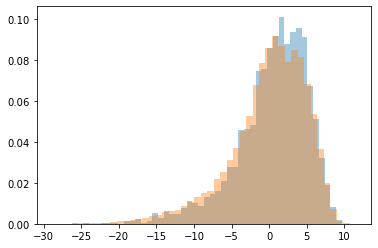

In [36]:
Seattle = ds_CTRL_weekly_anom.sel(lat=49,lon=240,method='nearest')

forecastinds =  np.array(DFforecast[DFforecast['ENSO']>1].Ind_3lead)
forecastinds =  forecastinds[forecastinds!=-999]

plt.hist(np.array(Seattle.TS.isel(time=forecastinds)),47,normed=True,alpha=.4)
plt.hist(np.array(Seattle.TS),47,normed=True,alpha=.4)

plt.show()

In [67]:
clevsHSS=np.arange(-np.max(np.abs(plot_field)),np.max(np.abs(plot_field))+1e-9,1e-9) 
clevsHSS

array([-1.53213069e-08, -1.43213069e-08, -1.33213069e-08, -1.23213069e-08,
       -1.13213069e-08, -1.03213069e-08, -9.32130689e-09, -8.32130689e-09,
       -7.32130689e-09, -6.32130689e-09, -5.32130689e-09, -4.32130689e-09,
       -3.32130689e-09, -2.32130689e-09, -1.32130689e-09, -3.21306890e-10,
        6.78693110e-10,  1.67869311e-09,  2.67869311e-09,  3.67869311e-09,
        4.67869311e-09,  5.67869311e-09,  6.67869311e-09,  7.67869311e-09,
        8.67869311e-09,  9.67869311e-09,  1.06786931e-08,  1.16786931e-08,
        1.26786931e-08,  1.36786931e-08,  1.46786931e-08,  1.56786931e-08])

In [61]:
np.max(np.abs(plot_field))

1.5321307e-08

In [64]:
ds_CTRL_weekly_anom.lat.data

array([15.54973793, 16.49214745, 17.43455505, 18.37696266, 19.31937218,
       20.26177979, 21.2041893 , 22.14659691, 23.08900452, 24.03141403,
       24.97382164, 25.91623116, 26.85863876, 27.80104637, 28.74345589,
       29.68586349, 30.62827301, 31.57068062, 32.51308823, 33.45549774,
       34.39790726, 35.34031296, 36.28272247, 37.22513199, 38.16753769,
       39.1099472 , 40.05235672, 40.99476624, 41.93717194, 42.87958145,
       43.82199097, 44.76439667, 45.70680618, 46.6492157 , 47.5916214 ,
       48.53403091, 49.47644043, 50.41884995, 51.36125565, 52.30366516,
       53.24607468, 54.18848038, 55.13088989, 56.07329941, 57.01570511,
       57.95811462, 58.90052414, 59.84293365, 60.78533936, 61.72774887,
       62.67015839, 63.61256409, 64.55497742, 65.49738312, 66.43978882,
       67.38220215, 68.32460785, 69.26701355])

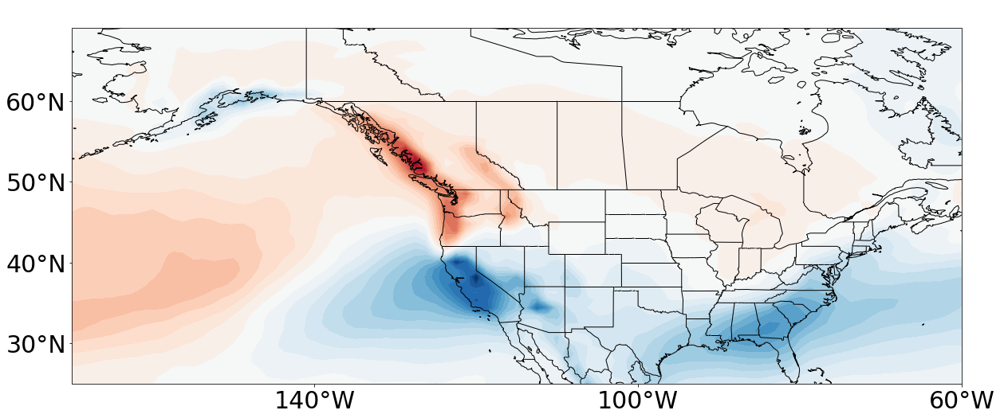

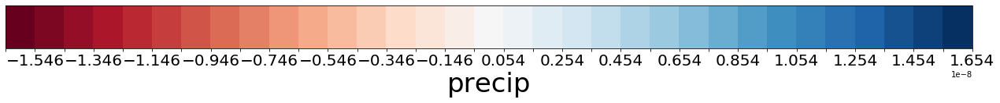

In [92]:
forecastinds =  np.array(DFforecast[DFforecast['ENSO']>1].index)

lat =ds_CTRL_weekly_anom.lat.data
lon = ds_CTRL_weekly_anom.lon.data
plot_field= np.mean(ds_CTRL_weekly_anom.PRECL[forecastinds,:,:],axis=0).data.squeeze()

plt.figure(figsize=(20, 20))
proj = ccrs.PlateCarree(central_longitude=180)
ax1 = plt.subplot(1, 1, 1, projection=proj)
ax1.coastlines('50m')

clevsHSS=np.arange(-np.max(np.abs(plot_field)),np.max(np.abs(plot_field))+1e-9,1e-9) 

haa = cm.get_cmap("Greys",len(clevsHSS))
haa = haa(np.linspace(0,1,len(clevsHSS)))
white=[1,1,1,1]
haa[:3,:] = white

#either do this 
cmap = copy.copy(mpl.cm.get_cmap("RdBu"))

#or set an ocean nanmask! 
nanmask = np.zeros_like(plot_field)+1


plt.contourf(lon-180, lat, (plot_field),levels=clevsHSS,
            cmap='RdBu', transform=proj)

plt.plot([120-180,300-180],[0,0],color='k',linewidth=1,linestyle='--',zorder=1)

# lons = [130.3, 130.3, 299.7, 299.7]
# lats = [-15.5, 14.5, 14.5, -15.5]
# ring = LinearRing(list(zip(lons, lats)))
# ax1.add_geometries([ring], ccrs.PlateCarree(), facecolor='none', edgecolor='black',linewidth=5)

states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='10m',
        facecolor='none')

ax1.set_xticks([100,140,180,220,260,300,340], crs=ccrs.PlateCarree())
ax1.set_yticks(np.arange(-10,80,10), crs=ccrs.PlateCarree())

lon_formatter = LongitudeFormatter(zero_direction_label=True,number_format='.0f')
lat_formatter = LatitudeFormatter()
ax1.xaxis.set_major_formatter(lon_formatter)
ax1.yaxis.set_major_formatter(lat_formatter)
ax1.tick_params(labelsize=30) 
ax1.set_extent([190,300,25,69], crs=ccrs.PlateCarree())
ax1.add_feature(states_provinces, edgecolor='black')
ax1.add_feature(cartopy.feature.BORDERS,edgecolor='black')
plt.title(' ',fontsize=30)

# plt.savefig('/Volumes/HotSlop/Figures_for_SP/Figures/RWS.png', dpi=300,bbox_inches='tight')
plt.show()


# ############################################################################################
#                                         ####colorbar#####
# ############################################################################################
fig, ax = plt.subplots(figsize=(22, 2))
fig.subplots_adjust(bottom=0.5)

#set these features the same as above. 
cmap = copy.copy(mpl.cm.get_cmap("RdBu"))
bounds=clevsHSS

norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
cb2 = mpl.colorbar.ColorbarBase(ax, cmap=cmap,
                                norm=norm,
                                orientation='horizontal', extend='neither',
                                ticks=bounds)


cb2.ax.tick_params(labelsize=20) 
for label in cb2.ax.xaxis.get_ticklabels()[::2]:
    label.set_visible(False)
cb2.set_label('precip',fontsize=34) 
# plt.savefig('/glade/work/wchapman/ECMWF_20C/Figures/colorbar.png', dpi=300,bbox_inches='tight')
plt.show()


In [73]:
plot_field= np.mean(ds_CTRL_weekly_anom.PSL[forecastinds,:,:],axis=0).data.squeeze()
clevsHSS=np.arange(-np.max(np.abs(plot_field)),np.max(np.abs(plot_field))+20,20) 
clevsHSS

array([-415.03512573, -395.03512573, -375.03512573, -355.03512573,
       -335.03512573, -315.03512573, -295.03512573, -275.03512573,
       -255.03512573, -235.03512573, -215.03512573, -195.03512573,
       -175.03512573, -155.03512573, -135.03512573, -115.03512573,
        -95.03512573,  -75.03512573,  -55.03512573,  -35.03512573,
        -15.03512573,    4.96487427,   24.96487427,   44.96487427,
         64.96487427,   84.96487427,  104.96487427,  124.96487427,
        144.96487427,  164.96487427,  184.96487427,  204.96487427,
        224.96487427,  244.96487427,  264.96487427,  284.96487427,
        304.96487427,  324.96487427,  344.96487427,  364.96487427,
        384.96487427,  404.96487427,  424.96487427])

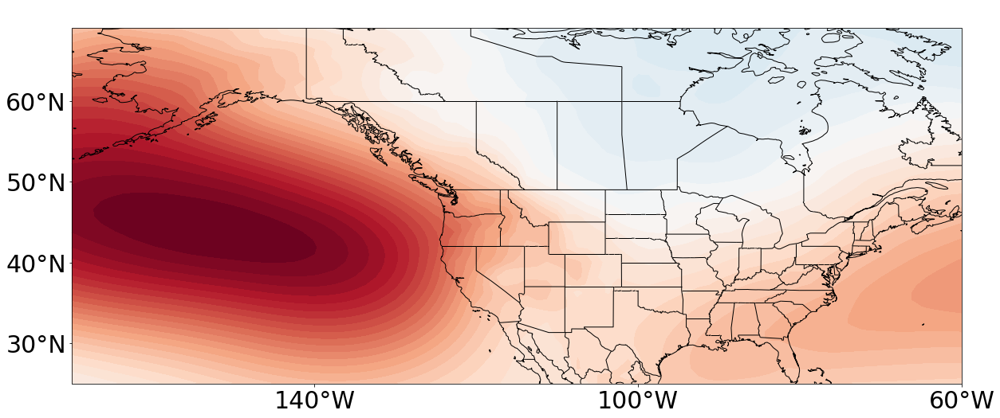

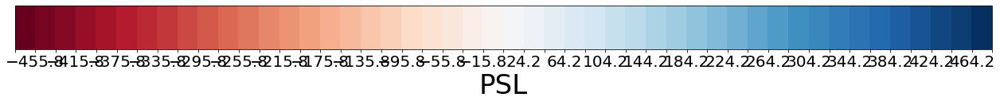

In [97]:
forecastinds =  np.array(DFforecast[DFforecast['ENSO']>1].index)
forecastinds =  forecastinds[forecastinds!=-999]

lat =ds_CTRL_weekly_anom.lat.data
lon = ds_CTRL_weekly_anom.lon.data
plot_field= np.mean(ds_CTRL_weekly_anom.PSL[forecastinds,:,:],axis=0).data.squeeze()

plt.figure(figsize=(20, 20))
proj = ccrs.PlateCarree(central_longitude=180)
ax1 = plt.subplot(1, 1, 1, projection=proj)
ax1.coastlines('50m')

clevsHSS=np.arange(-np.max(np.abs(plot_field)),np.max(np.abs(plot_field))+20,20) 
clevsHSS
haa = cm.get_cmap("Greys",len(clevsHSS))
haa = haa(np.linspace(0,1,len(clevsHSS)))
white=[1,1,1,1]
haa[:3,:] = white

#either do this 
cmap = copy.copy(mpl.cm.get_cmap("RdBu"))

#or set an ocean nanmask! 
nanmask = np.zeros_like(plot_field)+1


plt.contourf(lon-180, lat, (plot_field),levels=clevsHSS,
            cmap='RdBu', transform=proj)

plt.plot([120-180,300-180],[0,0],color='k',linewidth=1,linestyle='--',zorder=1)

# lons = [130.3, 130.3, 299.7, 299.7]
# lats = [-15.5, 14.5, 14.5, -15.5]
# ring = LinearRing(list(zip(lons, lats)))
# ax1.add_geometries([ring], ccrs.PlateCarree(), facecolor='none', edgecolor='black',linewidth=5)

states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='10m',
        facecolor='none')

ax1.set_xticks([100,140,180,220,260,300,340], crs=ccrs.PlateCarree())
ax1.set_yticks(np.arange(-10,80,10), crs=ccrs.PlateCarree())

lon_formatter = LongitudeFormatter(zero_direction_label=True,number_format='.0f')
lat_formatter = LatitudeFormatter()
ax1.xaxis.set_major_formatter(lon_formatter)
ax1.yaxis.set_major_formatter(lat_formatter)
ax1.tick_params(labelsize=30) 
ax1.set_extent([190,300,25,69], crs=ccrs.PlateCarree())
ax1.add_feature(states_provinces, edgecolor='black')
ax1.add_feature(cartopy.feature.BORDERS,edgecolor='black')
plt.title(' ',fontsize=30)

# plt.savefig('/Volumes/HotSlop/Figures_for_SP/Figures/RWS.png', dpi=300,bbox_inches='tight')
plt.show()


# ############################################################################################
#                                         ####colorbar#####
# ############################################################################################
fig, ax = plt.subplots(figsize=(22, 2))
fig.subplots_adjust(bottom=0.5)

#set these features the same as above. 
cmap = copy.copy(mpl.cm.get_cmap("RdBu"))
bounds=clevsHSS

norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
cb2 = mpl.colorbar.ColorbarBase(ax, cmap=cmap,
                                norm=norm,
                                orientation='horizontal', extend='neither',
                                ticks=bounds)


cb2.ax.tick_params(labelsize=20) 
for label in cb2.ax.xaxis.get_ticklabels()[::2]:
    label.set_visible(False)
cb2.set_label('PSL',fontsize=34) 
# plt.savefig('/glade/work/wchapman/ECMWF_20C/Figures/colorbar.png', dpi=300,bbox_inches='tight')
plt.show()

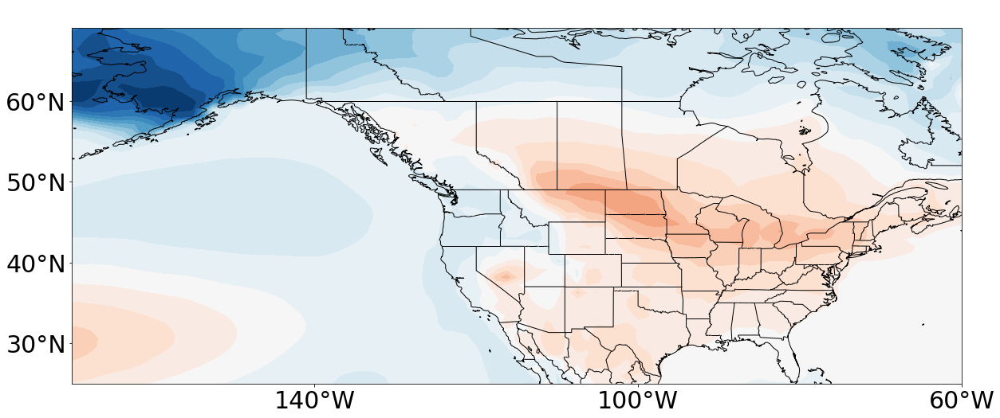

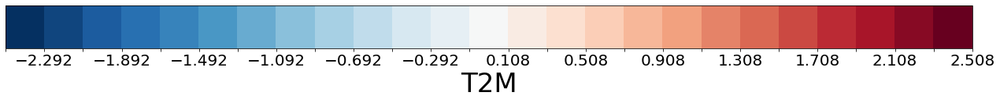

In [99]:
forecastinds =  np.array(DFforecast[DFforecast['ENSO']<-1].index)
forecastinds =  forecastinds[forecastinds!=-999]

plot_field= np.mean(ds_CTRL_weekly_anom.TS[forecastinds,:,:],axis=0).data.squeeze()
clevsHSS=np.arange(-np.max(np.abs(plot_field)),np.max(np.abs(plot_field))+0.2,0.2) 
clevsHSS


lat =ds_CTRL_weekly_anom.lat.data
lon = ds_CTRL_weekly_anom.lon.data

plt.figure(figsize=(20, 20))
proj = ccrs.PlateCarree(central_longitude=180)
ax1 = plt.subplot(1, 1, 1, projection=proj)
ax1.coastlines('50m')

haa = cm.get_cmap("Greys",len(clevsHSS))
haa = haa(np.linspace(0,1,len(clevsHSS)))
white=[1,1,1,1]
haa[:3,:] = white

#either do this 
cmap = copy.copy(mpl.cm.get_cmap("RdBu_r"))

#or set an ocean nanmask! 
nanmask = np.zeros_like(plot_field)+1


plt.contourf(lon-180, lat, (plot_field),levels=clevsHSS,
            cmap='RdBu_r', transform=proj)

plt.plot([120-180,300-180],[0,0],color='k',linewidth=1,linestyle='--',zorder=1)

# lons = [130.3, 130.3, 299.7, 299.7]
# lats = [-15.5, 14.5, 14.5, -15.5]
# ring = LinearRing(list(zip(lons, lats)))
# ax1.add_geometries([ring], ccrs.PlateCarree(), facecolor='none', edgecolor='black',linewidth=5)

states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='10m',
        facecolor='none')

ax1.set_xticks([100,140,180,220,260,300,340], crs=ccrs.PlateCarree())
ax1.set_yticks(np.arange(-10,80,10), crs=ccrs.PlateCarree())

lon_formatter = LongitudeFormatter(zero_direction_label=True,number_format='.0f')
lat_formatter = LatitudeFormatter()
ax1.xaxis.set_major_formatter(lon_formatter)
ax1.yaxis.set_major_formatter(lat_formatter)
ax1.tick_params(labelsize=30) 
ax1.set_extent([190,300,25,69], crs=ccrs.PlateCarree())
ax1.add_feature(states_provinces, edgecolor='black')
ax1.add_feature(cartopy.feature.BORDERS,edgecolor='black')
plt.title(' ',fontsize=30)

# plt.savefig('/Volumes/HotSlop/Figures_for_SP/Figures/RWS.png', dpi=300,bbox_inches='tight')
plt.show()


# ############################################################################################
#                                         ####colorbar#####
# ############################################################################################
fig, ax = plt.subplots(figsize=(22, 2))
fig.subplots_adjust(bottom=0.5)

#set these features the same as above. 
cmap = copy.copy(mpl.cm.get_cmap("RdBu_r"))
bounds=clevsHSS

norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
cb2 = mpl.colorbar.ColorbarBase(ax, cmap=cmap,
                                norm=norm,
                                orientation='horizontal', extend='neither',
                                ticks=bounds)


cb2.ax.tick_params(labelsize=20) 
for label in cb2.ax.xaxis.get_ticklabels()[::2]:
    label.set_visible(False)
cb2.set_label('T2M',fontsize=34) 
# plt.savefig('/glade/work/wchapman/ECMWF_20C/Figures/colorbar.png', dpi=300,bbox_inches='tight')
plt.show()

In [ ]:
forecastinds =  np.array(DFforecast[DFforecast['ENSO']<-1].index)
forecastinds =  forecastinds[forecastinds!=-999]

plt.pcolor(np.mean(ds_CTRL_weekly_anom.PRECL[forecastinds,:,:],axis=0),cmap='RdBu')
plt.colorbar()
plt.show()

In [ ]:
forecastinds =  np.array(DFforecast[DFforecast['ENSO']>1].index)
forecastinds =  forecastinds[forecastinds!=-999]

plt.pcolor(np.mean(ds_CTRL_weekly_anom.TS[forecastinds,:,:],axis=0),cmap='RdBu_r')
plt.colorbar()
plt.show()

In [ ]:
forecastinds =  np.array(DFforecast[DFforecast['ENSO']>1].index)
forecastinds =  forecastinds[forecastinds!=-999]

plt.pcolor(np.mean(ds_CTRL_weekly_anom.PSL[forecastinds,:,:],axis=0),cmap='RdBu_r',vmin=-400,vmax=400)
plt.colorbar()
plt.show()

In [329]:
from scipy import stats
stats.mode(np.array(Seattle.TS.isel(time=forecastinds)))

ModeResult(mode=array([3.3255005], dtype=float32), count=array([762]))

In [41]:
hits =0
for bb in range(len(verified)):
    hits+=np.sum(verified[bb] == yhat[bb])
    
HSS = (hits-(int(len(verified)*0.3333)))/(len(verified)-(int(len(verified)*0.3333)))*100
HSS

In [42]:
hits

10112

In [43]:
HSS = (hits-(int(len(verified)*0.3333)))/(len(verified)-(int(len(verified)*0.3333)))*100

In [44]:
HSS

9.035195237261426

In [303]:
(hits-(int(len(verified)*0.3333)))

529

In [304]:
(len(verified)-(int(len(verified)*0.3333)))

17133

In [305]:
Seattleqt.TS

<xarray.DataArray 'TS' (quantile: 2)>
array([-0.77521775,  2.12750992])
Coordinates:
    lon       float64 240.0
    lat       float64 46.65
  * quantile  (quantile) float64 0.3333 0.6667

In [313]:
np.percentile(Seattle.TS,66.666666)

2.1275604854547128

In [311]:
threethree

-0.7752177480680942

In [314]:
sixsix

2.1275099240875246

## Calculate Quantiles for Every Variable.

In [21]:
%%time
qt_dims = ("time")
qt_values = (0.3333333, 0.66666)
ds_qt = ds_CTRL_weekly_anom.quantile(qt_values, dim=qt_dims)

CPU times: user 11.9 s, sys: 0 ns, total: 11.9 s
Wall time: 11.9 s


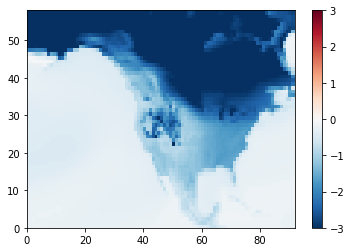

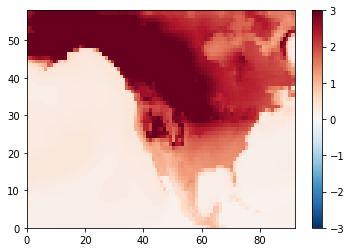

In [28]:

plt.pcolor(ds_qt['TS'][0,:,:],cmap='RdBu_r',vmin=-3,vmax=3)
plt.colorbar()
plt.show()
plt.pcolor(ds_qt['TS'][1,:,:],cmap='RdBu_r',vmin=-3,vmax=3)
plt.colorbar()
plt.show()

## Calculate Quantiles

In [33]:
ds_TS_weekly_anom = ds_CTRL_weekly_anom['TS']
ds_TS_weekly_anom = ds_TS_weekly_anom.chunk({'time': -1})
qt_dims = ("time")
qt_values = (0.3333333, 0.66666)
ds_qt = ds_TS_weekly_anom.quantile(qt_values, dim=qt_dims)


In [35]:
%%time
ds_qt.load()

<xarray.DataArray 'TS' (quantile: 2, lat: 58, lon: 92)>
array([[[-0.19142663, -0.19542151, -0.19932495, ..., -0.18899829,
         -0.18809582, -0.19018273],
        [-0.18764829, -0.18895473, -0.19127985, ..., -0.19057068,
         -0.19103716, -0.19150072],
        [-0.18689837, -0.18797232, -0.18731257, ..., -0.19144404,
         -0.19356865, -0.19525293],
        ...,
        [-4.68872133, -4.6750416 , -4.55739229, ..., -2.58954421,
         -2.5570552 , -2.6603395 ],
        [-4.40331998, -4.44682574, -4.45865694, ..., -2.57782065,
         -2.5574625 , -2.65352516],
        [-4.0755083 , -4.18324938, -4.24640245, ..., -2.62317446,
         -2.70631593, -2.78586828]],

       [[ 0.17184885,  0.1731386 ,  0.17651768, ...,  0.13922048,
          0.13833783,  0.13720904],
        [ 0.16721476,  0.16986744,  0.17090904, ...,  0.14342177,
          0.14278891,  0.1429302 ],
        [ 0.16480494,  0.16557895,  0.16829101, ...,  0.14603663,
          0.14672426,  0.14746058],
        ...,
        [ 2.84180367,  2.91591935,  3.06300054, ...,  1.34819397,
          1.31318183,  1.44220637],
        [ 2.59379354,  2.7320939 ,  2.97848278, ...,  1.40273863,
          1.4037631 ,  1.56999671],
        [ 2.44941403,  2.59834073,  2.80885973, ...,  1.49583835,
          1.58357422,  1.73931655]]])
Coordinates:
  * lat       (lat) float64 15.55 16.49 17.43 18.38 ... 66.44 67.38 68.32 69.27
  * lon       (lon) float64 190.0 191.2 192.5 193.8 ... 300.0 301.2 302.5 303.8
  * quantile  (quantile) float64 0.3333 0.6667

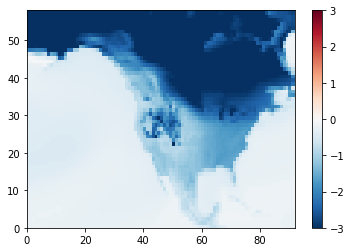

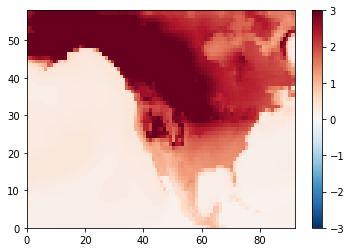

In [62]:
plt.pcolor(ds_qt[0,:,:],cmap='RdBu_r',vmin=-3,vmax=3)
plt.colorbar()
plt.show()
plt.pcolor(ds_qt[1,:,:],cmap='RdBu_r',vmin=-3,vmax=3)
plt.colorbar()
plt.show()

In [64]:
ds_TS_weekly_anom.where(ds_TS_weekly_anom > ds_qt.sel(quantile=qt_values[0]))

<xarray.DataArray 'TS' (time: 31097, lat: 58, lon: 92)>
dask.array<where, shape=(31097, 58, 92), dtype=float32, chunksize=(31097, 58, 92), chunktype=numpy.ndarray>
Coordinates:
  * time       (time) object 0402-01-01 00:00:00 ... 2200-12-25 00:00:00
    member_id  int64 1
  * lat        (lat) float64 15.55 16.49 17.43 18.38 ... 66.44 67.38 68.32 69.27
  * lon        (lon) float64 190.0 191.2 192.5 193.8 ... 300.0 301.2 302.5 303.8
    quantile   float64 0.3333

In [65]:
beans = ds_TS_weekly_anom.where(ds_TS_weekly_anom > ds_qt.sel(quantile=qt_values[0]))

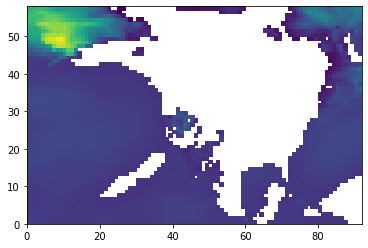

In [68]:
plt.pcolor(beans[0,:,:])

## I think we can do it with all the variables

In [ ]:
ds_CTRL_weekly_anom = ds_CTRL_weekly_anom.chunk({'time': -1})
qt_dims = ("time")
qt_values = (0.3333333, 0.66666)
ds_qt = ds_CTRL_weekly_anom.quantile(qt_values, dim=qt_dims)


In [ ]:
%%time
ds_qt.load()

In [ ]:
#locations?? 
ds_outliers = ds_CTRL_weekly_anom.where(
    (ds_CTRL_weekly_anom.TS > ds_qt.TS.sel(quantile=qt_values[0])))
)

In [ ]:
ds_qt

## Explore it 

In [27]:
ds_CTRL_weekly_anom

,Array,Chunk
Bytes,663.73 MB,21.34 kB
Shape,"(31097, 58, 92)","(1, 58, 92)"
Count,747130 Tasks,31097 Chunks
Type,float32,numpy.ndarray


In [25]:
ds_CTRL_weekly_anom.time

<xarray.DataArray 'time' (time: 31097)>
array([cftime.DatetimeNoLeap(402, 1, 1, 0, 0, 0, 0, 3, 1),
       cftime.DatetimeNoLeap(402, 1, 8, 0, 0, 0, 0, 3, 8),
       cftime.DatetimeNoLeap(402, 1, 15, 0, 0, 0, 0, 3, 15), ...,
       cftime.DatetimeNoLeap(2200, 12, 11, 0, 0, 0, 0, 3, 345),
       cftime.DatetimeNoLeap(2200, 12, 18, 0, 0, 0, 0, 3, 352),
       cftime.DatetimeNoLeap(2200, 12, 25, 0, 0, 0, 0, 3, 359)], dtype=object)
Coordinates:
  * time     (time) object 0402-01-01 00:00:00 ... 2200-12-25 00:00:00

In [28]:
#do quantiles here: 

# https://stackoverflow.com/questions/62698837/calculating-percentile-for-each-gridpoint-in-xarray

In [ ]:
qt_dims = ("time")
qt_values = (0.3333333, 0.66666)
ds_qt = ds_CTRL_weekly_anom.quantile(qt_values, dim=qt_dims)


#select when each one is where:

da_outliers_loc = np.logical_and(
    ds.precipitation > ds_qt.precipitation.sel(quantile=qt_values[0]),
    ds.temperature > ds_qt.temperature.sel(quantile=qt_values[1]),
)


#locations?? 
ds_outliers = ds.where(
    (ds.precipitation > ds_qt.precipitation.sel(quantile=qt_values[0]))
    & (ds.temperature > ds_qt.temperature.sel(quantile=qt_values[1]))
)

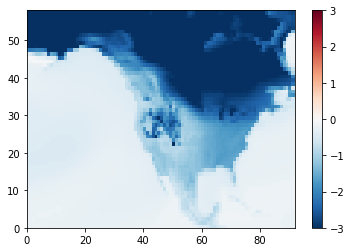

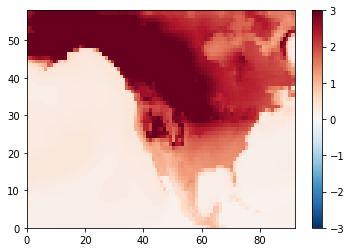

In [61]:
plt.pcolor(ds_qt[0,:,:],cmap='RdBu_r',vmin=-3,vmax=3)
plt.colorbar()
plt.show()
plt.pcolor(ds_qt[1,:,:],cmap='RdBu_r',vmin=-3,vmax=3)
plt.colorbar()
plt.show()

In [53]:
ds_qt.shape

(2, 58, 92)

In [43]:
np.array(ds_qt.quantile)

array(<bound method DataArray.quantile of <xarray.DataArray 'TS' (quantile: 2, lat: 58, lon: 92)>
array([[[-0.19142663, -0.19542151, -0.19932495, ..., -0.18899829,
         -0.18809582, -0.19018273],
        [-0.18764829, -0.18895473, -0.19127985, ..., -0.19057068,
         -0.19103716, -0.19150072],
        [-0.18689837, -0.18797232, -0.18731257, ..., -0.19144404,
         -0.19356865, -0.19525293],
        ...,
        [-4.68872133, -4.6750416 , -4.55739229, ..., -2.58954421,
         -2.5570552 , -2.6603395 ],
        [-4.40331998, -4.44682574, -4.45865694, ..., -2.57782065,
         -2.5574625 , -2.65352516],
        [-4.0755083 , -4.18324938, -4.24640245, ..., -2.62317446,
         -2.70631593, -2.78586828]],

       [[ 0.17184885,  0.1731386 ,  0.17651768, ...,  0.13922048,
          0.13833783,  0.13720904],
        [ 0.16721476,  0.16986744,  0.17090904, ...,  0.14342177,
          0.14278891,  0.1429302 ],
        [ 0.16480494,  0.16557895,  0.16829101, ...,  0.14603663,
     

In [12]:
%%time
DS = ds_CTRL_weekly_anom.load()

CPU times: user 7min 39s, sys: 12min 37s, total: 20min 17s
Wall time: 16min 25s


In [13]:
Tref = np.array(DS.TREFHT).squeeze()


NameError: name 'DS' is not defined

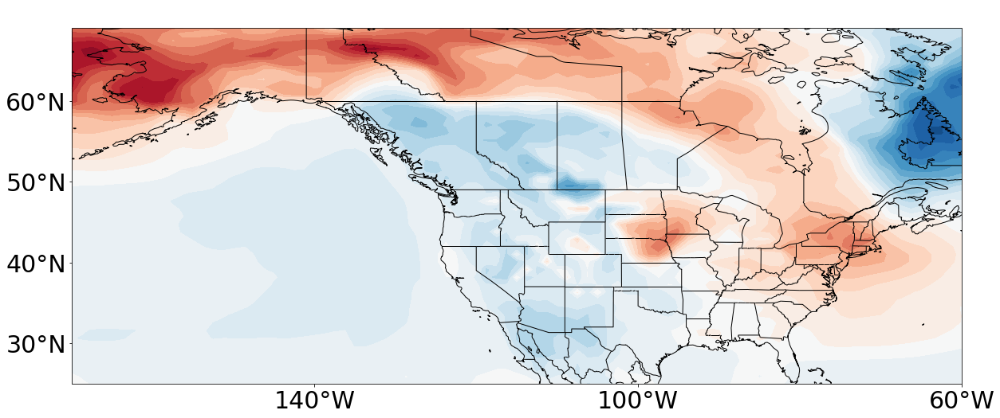

In [25]:
plot_field= Tref[10,:,:].squeeze()
lon = DS['lon'].data
lat = DS['lat'].data

plt.figure(figsize=(20, 20))
proj = ccrs.PlateCarree(central_longitude=180)
ax1 = plt.subplot(1, 1, 1, projection=proj)
ax1.coastlines('50m')

clevsRWS=np.arange(-14,14,1) 

haa = cm.get_cmap("Greys",len(clevsRWS))
haa = haa(np.linspace(0,1,len(clevsRWS)))
white=[1,1,1,1]
haa[:3,:] = white

#either do this 
cmap = copy.copy(mpl.cm.get_cmap("RdBu_r"))

#or set an ocean nanmask! 
nanmask = np.zeros_like(plot_field)+1


plt.contourf(lon-180, lat, (plot_field),levels=clevsRWS,
            cmap='RdBu', transform=proj)

# plt.contour(lon_pre-180, lat_pre, (plot_pre.T),[-8,-7,-6,-5,-4,-3,-2,-1,1,2,3,4,5,6,7,8], transform=proj,colors='k',linewidths=1.5)
# # plt.contour(lon_pre-180, lat_pre, (plot_pre.T),levels=[0,0.01], transform=proj,colors='k',linewidths=2)

# plt.contour(lon-180, lat,(uwnd_p),[45,50,60],colors='k',linewidths=3,linestyles='--',zorder=2)

# significant speckling
# siglats =[];
# siglons =[];
# for aa in range(len(lon)):
#     for bb in range(len(lat)):
#         if (((plot_field.squeeze())[aa,bb]<-7.5)):
#             siglons.append(lon[aa]-180)
#             siglats.append(lat[bb])

# plt.plot(siglons[::1],siglats[::1],'+',markersize=17,color='w',zorder=1)

# # significant speckling
# siglats =[];
# siglons =[];
# for aa in range(len(lon)):
#     for bb in range(len(lat)):
#         if (((plot_field.squeeze())[aa,bb]>7.5)):
#             siglons.append(lon[aa]-180)
#             siglats.append(lat[bb])

# plt.plot(siglons[::1],siglats[::1],'o',markersize=5,color='k')


# Q=ax1.quiver(XX[::wv,::wv], YY[::wv,::wv],uchi_field[::wv,::wv],vchi_field[::wv,::wv],color='k'
#            ,units='inches',scale=5,width=0.035,alpha=0.7,headwidth=2.4,zorder=2)
# qk = ax1.quiverkey(Q,0.9,1.03, 5, r'$ a$',fontproperties={'size': 23})


plt.plot([120-180,300-180],[0,0],color='k',linewidth=1,linestyle='--',zorder=1)

# lons = [130.3, 130.3, 299.7, 299.7]
# lats = [-15.5, 14.5, 14.5, -15.5]
# ring = LinearRing(list(zip(lons, lats)))
# ax1.add_geometries([ring], ccrs.PlateCarree(), facecolor='none', edgecolor='black',linewidth=5)

states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='10m',
        facecolor='none')

ax1.set_xticks([100,140,180,220,260,300,340], crs=ccrs.PlateCarree())
ax1.set_yticks(np.arange(-10,80,10), crs=ccrs.PlateCarree())

lon_formatter = LongitudeFormatter(zero_direction_label=True,number_format='.0f')
lat_formatter = LatitudeFormatter()
ax1.xaxis.set_major_formatter(lon_formatter)
ax1.yaxis.set_major_formatter(lat_formatter)
ax1.tick_params(labelsize=30) 
ax1.set_extent([190,300,25,69], crs=ccrs.PlateCarree())
ax1.add_feature(states_provinces, edgecolor='black')
ax1.add_feature(cartopy.feature.BORDERS,edgecolor='black')
plt.title(' ',fontsize=30)

# plt.savefig('/Volumes/HotSlop/Figures_for_SP/Figures/RWS.png', dpi=300,bbox_inches='tight')
plt.show()

## you can get the NINO3.4 index just from defining the bounds correctly in the same what you did above.

In [14]:
col_subset = col.search(
    frequency=["daily", "monthly"],
    component=['atm', 'ice_nh', 'ice_sh', 'lnd', 'ocn'],
    variable=["TS"],
    experiment=["CTRL","20C"],
)

col_subset

,unique
variable,1
long_name,1
component,1
experiment,2
frequency,2
vertical_levels,1
spatial_domain,1
units,1
start_time,4
end_time,4


In [15]:
# Load catalog entries for subset into a dictionary of xarray datasets
dsets = col_subset.to_dataset_dict(
    zarr_kwargs={"consolidated": True}, storage_options={"anon": True}
)
print(f"\nDataset dictionary keys:\n {dsets.keys()}")


--> The keys in the returned dictionary of datasets are constructed as follows:
	'component.experiment.frequency'



Dataset dictionary keys:
 dict_keys(['atm.20C.monthly', 'atm.20C.daily', 'atm.CTRL.monthly', 'atm.CTRL.daily'])


In [17]:
ds_CTRL = dsets["atm.CTRL.daily"]
ds_CTRL

# %%time
monthly = ds_CTRL.groupby('time.month').mean(dim='time') #remove the monthly average
ds_CTRL_anom = ds_CTRL.groupby('time.month') - monthly
ds_CTRL_weekly_anom = ds_CTRL_anom.resample(time ='7D').mean() #7day mean 
ds_CTRL_weekly_anom = ds_CTRL_weekly_anom.sel(lat=slice(-5,5),lon=slice(190,240)) # select lat/lon region 
months =  [12,1,2,3] # for example
ds_CTRL_weekly_anom  =  ds_CTRL_weekly_anom.sel(time = np.in1d(ds_CTRL_weekly_anom['time.month'], months))


In [37]:
DS.mean(("lat","lon"))

<xarray.Dataset>
Dimensions:    (member_id: 1, time: 31097)
Coordinates:
  * time       (time) object 0402-01-01 00:00:00 ... 2200-12-25 00:00:00
  * member_id  (member_id) int64 1
Data variables:
    TREFHT     (time, member_id) float32 -1.5938298 -1.6679999 ... -1.1272134

### Get the Grid Area

In [164]:
# My hacky solution to get around their bullshit
url = 's3://ncar-cesm-lens/atm/static/grid.zarr'
grid = xr.open_zarr(fsspec.get_mapper(url, anon=True), consolidated=True)

cell_area = grid.area.load()
# total_area = cell_area.sum()
# cell_area

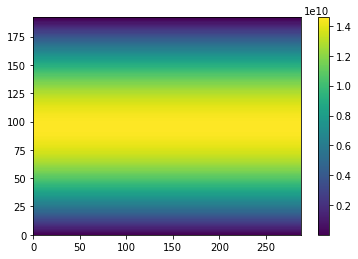

In [165]:
plt.pcolor(cell_area)
plt.colorbar()

In [166]:
cell_area

<xarray.DataArray 'area' (lat: 192, lon: 288)>
array([[2.994837e+07, 2.994837e+07, 2.994837e+07, ..., 2.994837e+07,
        2.994837e+07, 2.994837e+07],
       [2.395748e+08, 2.395748e+08, 2.395748e+08, ..., 2.395748e+08,
        2.395748e+08, 2.395748e+08],
       [4.790848e+08, 4.790848e+08, 4.790848e+08, ..., 4.790848e+08,
        4.790848e+08, 4.790848e+08],
       ...,
       [4.790848e+08, 4.790848e+08, 4.790848e+08, ..., 4.790848e+08,
        4.790848e+08, 4.790848e+08],
       [2.395748e+08, 2.395748e+08, 2.395748e+08, ..., 2.395748e+08,
        2.395748e+08, 2.395748e+08],
       [2.994837e+07, 2.994837e+07, 2.994837e+07, ..., 2.994837e+07,
        2.994837e+07, 2.994837e+07]], dtype=float32)
Coordinates:
    P0       float64 1e+05
    area     (lat, lon) float32 29948370.0 29948370.0 ... 29948370.0 29948370.0
    gw       (lat) float64 3.382e-05 nan nan nan nan ... nan nan nan 3.382e-05
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
    ntrk     int32 1
    ntrm     int32 1
    ntrn     int32 1
    wnummax  (lat) int32 1 -2147483648 -2147483648 ... -2147483648 -2147483648 1
Attributes:
    long_name:      Grid-Cell Area
    standard_name:  cell_area
    units:          m2

In [72]:
col_subset

,unique
variable,72
long_name,69
component,5
experiment,2
frequency,3
vertical_levels,3
spatial_domain,5
units,25
start_time,5
end_time,5


In [118]:
bb = col.df
bb[bb['frequency']=='static']

,variable,long_name,component,experiment,frequency,vertical_levels,spatial_domain,units,start_time,end_time,path
215,NaN,NaN,atm,CTRL,static,NaN,global,NaN,NaN,NaN,s3://ncar-cesm-lens/atm/static/grid.zarr
216,NaN,NaN,atm,HIST,static,NaN,global,NaN,NaN,NaN,s3://ncar-cesm-lens/atm/static/grid.zarr
217,NaN,NaN,atm,RCP85,static,NaN,global,NaN,NaN,NaN,s3://ncar-cesm-lens/atm/static/grid.zarr
218,NaN,NaN,atm,20C,static,NaN,global,NaN,NaN,NaN,s3://ncar-cesm-lens/atm/static/grid.zarr
233,NaN,NaN,ice_nh,CTRL,static,NaN,artic_ocean,NaN,NaN,NaN,s3://ncar-cesm-lens/ice_nh/static/grid.zarr
234,NaN,NaN,ice_nh,HIST,static,NaN,artic_ocean,NaN,NaN,NaN,s3://ncar-cesm-lens/ice_nh/static/grid.zarr
235,NaN,NaN,ice_nh,RCP85,static,NaN,artic_ocean,NaN,NaN,NaN,s3://ncar-cesm-lens/ice_nh/static/grid.zarr
236,NaN,NaN,ice_nh,20C,static,NaN,artic_ocean,NaN,NaN,NaN,s3://ncar-cesm-lens/ice_nh/static/grid.zarr
251,NaN,NaN,ice_sh,CTRL,static,NaN,antarctica,NaN,NaN,NaN,s3://ncar-cesm-lens/ice_sh/static/grid.zarr
252,NaN,NaN,ice_sh,HIST,static,NaN,antarctica,NaN,NaN,NaN,s3://ncar-cesm-lens/ice_sh/static/grid.zarr


In [119]:
s3://ncar-cesm-lens/atm/static/grid.zarr

SyntaxError: invalid syntax (<ipython-input-119-c3215b6160e6>, line 1)

In [123]:
import zarr
z1 = zarr.open('s3://ncar-cesm-lens/atm/static/grid.zarr')

In [46]:
ds_CTRL_weekly_anom

,Array,Chunk
Bytes,1.02 GB,10.92 kB
Shape,"(93805, 1, 42, 65)","(1, 1, 42, 65)"
Count,684936 Tasks,93805 Chunks
Type,float32,numpy.ndarray


In [32]:
ARRAY = np.array(ts_a.TREFHT).squeeze()
lon = ts_a['lon'].data
lat = ts_a['lat'].data

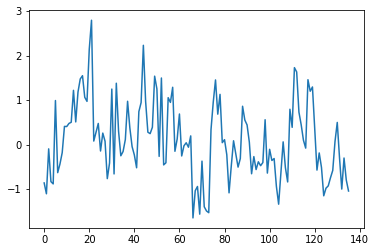

In [24]:
plt.plot(ARRAY[:,15,10])


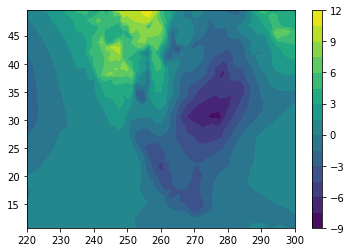

In [33]:
plt.contourf(lon,lat,ARRAY[10,:,:],16)
plt.colorbar()
plt.show()

In [34]:
monthly

<xarray.Dataset>
Dimensions:    (lat: 192, lon: 288, member_id: 1, month: 12)
Coordinates:
  * lat        (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * member_id  (member_id) int64 1
  * lon        (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * month      (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Data variables:
    TREFHT     (month, member_id, lat, lon) float32 dask.array<chunksize=(1, 1, 192, 288), meta=np.ndarray>

## Mess with EOFS

In [60]:
ds_HIST = ds_HIST.sel(lat=slice(20,75),lon=slice(150,300))
months =  [12,1,2] # for example
season  =  ds_HIST.sel(time = np.in1d( ds_HIST['time.month'], months))
z500 = np.array(season.Z3.data[:,18,:,:])
lats = season['lat'].data
lons = season['lon'].data
# llv = 524.68717471#get 200 hPa level.
# ds_HIST = ds_HIST.sel(lev=slice(llv,llv))

## Compute EOF as correlation

In [64]:

#remove the mean. 
z500_a = z500-np.mean(z500,axis=0)

# Create an EOF solver to do the EOF analysis. Square-root of cosine of
# latitude weights are applied before the computation of EOFs.
coslat = np.cos(np.deg2rad(lats)).clip(0., 1.)
wgts = np.sqrt(coslat)[..., np.newaxis]
solver = Eof(z500, weights=wgts)

# Retrieve the leading EOF, expressed as the covariance between the leading PC
# time series and the input SLP anomalies at each grid point.
eof1 = solver.eofsAsCovariance(neofs=1)
pcs = solver.pcs(npcs = 3)

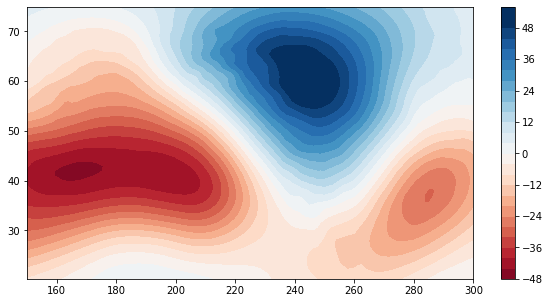

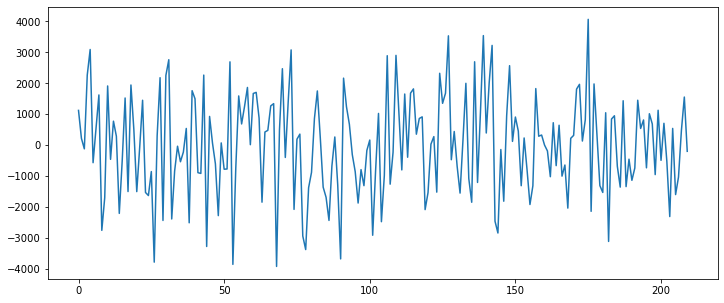

In [65]:
plt.figure(figsize=(10,5))
plt.contourf(lons,lats,eof1.squeeze(),30,cmap='RdBu',vmin=-50,vmax=50)
plt.colorbar()
plt.show()

plt.figure(figsize=(12,5))
plt.plot(pcs[:,0])
plt.show()

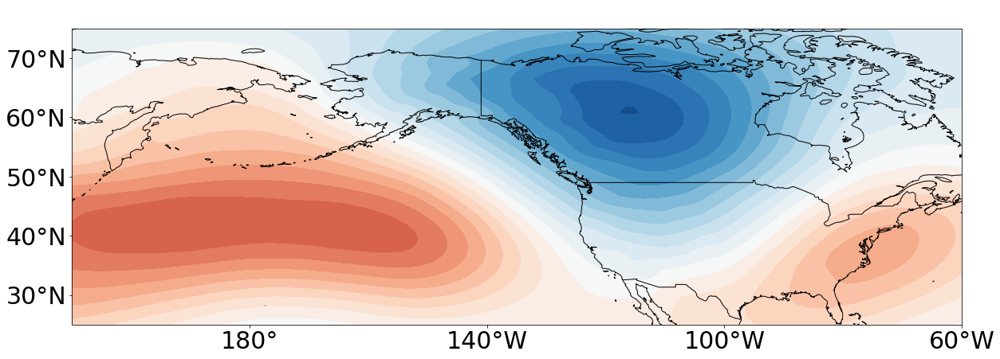

In [68]:

plot_field= eof1.squeeze()
lon =lons
lat= lats

plt.figure(figsize=(20, 20))
proj = ccrs.PlateCarree(central_longitude=180)
ax1 = plt.subplot(1, 1, 1, projection=proj)
ax1.coastlines('50m')

clevsRWS=np.arange(-70,70,5) 

haa = cm.get_cmap("Greys",len(clevsRWS))
haa = haa(np.linspace(0,1,len(clevsRWS)))
white=[1,1,1,1]
haa[:3,:] = white

#either do this 
cmap = copy.copy(mpl.cm.get_cmap("RdBu_r"))

#or set an ocean nanmask! 
nanmask = np.zeros_like(plot_field)+1


plt.contourf(lon-180, lat, (plot_field),levels=clevsRWS,
            cmap='RdBu', transform=proj)


plt.plot([120-180,300-180],[0,0],color='k',linewidth=1,linestyle='--',zorder=1)

states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='10m',
        facecolor='none')

ax1.set_xticks([100,140,180,220,260,300,340], crs=ccrs.PlateCarree())
ax1.set_yticks(np.arange(-10,80,10), crs=ccrs.PlateCarree())

lon_formatter = LongitudeFormatter(zero_direction_label=True,number_format='.0f')
lat_formatter = LatitudeFormatter()
ax1.xaxis.set_major_formatter(lon_formatter)
ax1.yaxis.set_major_formatter(lat_formatter)
ax1.tick_params(labelsize=30) 
ax1.set_extent([150,300,25,75], crs=ccrs.PlateCarree())
# ax1.add_feature(states_provinces, edgecolor='black')
ax1.add_feature(cartopy.feature.BORDERS,edgecolor='black')
plt.title(' ',fontsize=30)

# plt.savefig('/Volumes/HotSlop/Figures_for_SP/Figures/RWS.png', dpi=300,bbox_inches='tight')
plt.show()

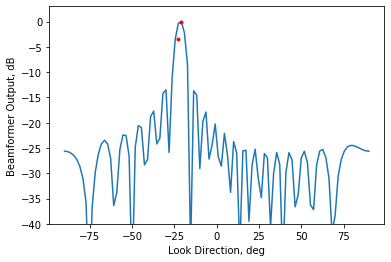

In [133]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import MultiTaskLasso

# experiment specifications
numEl = 20
numLook = 1e2
arrayPosition = np.arange(numEl) * np.pi
thetaLook = np.r_[0 : np.pi : numLook * 1j] - (np.pi / 2)
thetaSource = -0.3758

# Make grid of look vectors
W = np.exp(1j * np.sin(thetaLook)[:,None] * arrayPosition)
data = np.exp(1j * np.sin(thetaSource) * arrayPosition).T

# Bartlet beamformer
bartlet = np.abs(np.dot(W.conj(), data))**2
B_bart = 10 * np.log10(np.abs(bartlet)); B_bart-=np.max(B_bart)

# Lasso setup
X = W.T
XSplit = np.vstack((np.hstack((X.real, X.imag)),\
                    np.hstack((-X.imag, X.real))))


YSplit = np.hstack((np.vstack((data.real, data.imag)),\
                    np.vstack((-data.imag, data.real)))).T

lasso_solver = MultiTaskLasso(alpha=0.1)
lasso = lasso_solver.fit(XSplit, YSplit).coef_

# Manipulate result back into complex values
stack1 = np.squeeze(lasso[0,:])
stack1 = np.squeeze(stack1[:int(numLook)] + 1j * stack1[int(numLook):])
B_lasso = 10 * np.log10(np.abs(stack1) + np.spacing(1)); B_lasso -= np.max(B_lasso)

# stack1 ?= stack2 (Should be exact)
stack2 = np.squeeze(lasso[1,:])
stack2 = np.squeeze(-1j * stack2[:int(numLook)] + stack2[int(numLook):])
np.testing.assert_almost_equal(stack1, stack2, decimal=1)

# Plot both beamformer results
_ = plt.plot(np.rad2deg(thetaLook), B_bart)
_ = plt.plot(np.rad2deg(thetaLook), B_lasso, 'r.')
_ = plt.ylim(-40,3); plt.ylabel('Beamformer Output, dB')
_ = plt.xlabel('Look Direction, deg')

In [135]:
np.testing.assert_almost_equal(stack1, stack2, decimal=1)

In [154]:
stack1.shape

(100,)

In [151]:
stack1

array([0.        +0.j       , 0.        +0.j       ,
       0.        +0.j       , 0.        +0.j       ,
       0.        +0.j       , 0.        +0.j       ,
       0.        +0.j       , 0.        +0.j       ,
       0.        +0.j       , 0.        +0.j       ,
       0.        +0.j       , 0.        +0.j       ,
       0.        +0.j       , 0.        +0.j       ,
       0.        +0.j       , 0.        +0.j       ,
       0.        +0.j       , 0.        +0.j       ,
       0.        +0.j       , 0.        +0.j       ,
       0.        +0.j       , 0.        +0.j       ,
       0.        +0.j       , 0.        +0.j       ,
       0.        +0.j       , 0.        +0.j       ,
       0.        +0.j       , 0.        +0.j       ,
       0.        +0.j       , 0.        +0.j       ,
       0.        +0.j       , 0.        +0.j       ,
       0.        +0.j       , 0.        +0.j       ,
       0.        +0.j       , 0.        +0.j       ,
       0.        +0.j       , 0.21026411-0.137

In [152]:
stack2

array([0.        +0.j        , 0.        +0.j        ,
       0.        +0.j        , 0.        +0.j        ,
       0.        +0.j        , 0.        +0.j        ,
       0.        +0.j        , 0.        +0.j        ,
       0.        +0.j        , 0.        +0.j        ,
       0.        +0.j        , 0.        +0.j        ,
       0.        +0.j        , 0.        +0.j        ,
       0.        +0.j        , 0.        +0.j        ,
       0.        +0.j        , 0.        +0.j        ,
       0.        +0.j        , 0.        +0.j        ,
       0.        +0.j        , 0.        +0.j        ,
       0.        +0.j        , 0.        +0.j        ,
       0.        +0.j        , 0.        +0.j        ,
       0.        +0.j        , 0.        +0.j        ,
       0.        +0.j        , 0.        +0.j        ,
       0.        +0.j        , 0.        +0.j        ,
       0.        +0.j        , 0.        +0.j        ,
       0.        +0.j        , 0.        +0.j        ,
       0. 

In [39]:
import intake_esm
import intake
url = 'https://raw.githubusercontent.com/NCAR/cesm-lens-aws/master/intake-catalogs/aws-cesm1-le.json'
col = intake.open_esm_datastore(url)
col.search(component='ocn').df

,variable,long_name,component,experiment,frequency,vertical_levels,spatial_domain,units,start_time,end_time,path
0,DIC,dissolved inorganic carbon,ocn,20C,monthly,60.0,global_ocean,mmol/m^3,1920-01-16 12:00:00,2005-12-16 12:00:00,s3://ncar-cesm-lens/ocn/monthly/cesmLE-20C-DIC...
1,DOC,dissolved organic carbon,ocn,20C,monthly,60.0,global_ocean,mmol/m^3,1920-01-16 12:00:00,2005-12-16 12:00:00,s3://ncar-cesm-lens/ocn/monthly/cesmLE-20C-DOC...
2,FW,freshwater flux,ocn,20C,monthly,1.0,global_ocean,centimeter/s,1920-01-16 12:00:00,2005-12-16 12:00:00,s3://ncar-cesm-lens/ocn/monthly/cesmLE-20C-FW....
3,HMXL,mixed-layer depth,ocn,20C,monthly,1.0,global_ocean,centimeter,1920-01-16 12:00:00,2005-12-16 12:00:00,s3://ncar-cesm-lens/ocn/monthly/cesmLE-20C-HMX...
4,O2,dissolved oxygen,ocn,20C,monthly,60.0,global_ocean,mmol/m^3,1920-01-16 12:00:00,2005-12-16 12:00:00,s3://ncar-cesm-lens/ocn/monthly/cesmLE-20C-O2....
...,...,...,...,...,...,...,...,...,...,...,...
123,WVEL,vertical velocity,ocn,RCP85,monthly,60.0,global_ocean,centimeter/s,2006-01-16 12:00:00,2100-12-16 12:00:00,s3://ncar-cesm-lens/ocn/monthly/cesmLE-RCP85-W...
124,NaN,NaN,ocn,CTRL,static,NaN,global_ocean,NaN,NaN,NaN,s3://ncar-cesm-lens/ocn/static/grid.zarr
125,NaN,NaN,ocn,HIST,static,NaN,global_ocean,NaN,NaN,NaN,s3://ncar-cesm-lens/ocn/static/grid.zarr
126,NaN,NaN,ocn,RCP85,static,NaN,global_ocean,NaN,NaN,NaN,s3://ncar-cesm-lens/ocn/static/grid.zarr
